In [1]:
import os
import nilearn
import nibabel as nib
import matplotlib.pyplot as plt
from nilearn import plotting
import numpy as np
from nilearn.glm.first_level import FirstLevelModel, make_first_level_design_matrix
from nilearn.plotting import plot_contrast_matrix
from nilearn.image import resample_img
from nilearn import masking
from nilearn.image import new_img_like
import seaborn as sns

In [2]:
plt.style.use('default')

In [4]:
maskDir = 'N:\Experimental_Data\yujunchen\projects\data\masks'
maskFile = os.path.join(maskDir, 'MNI152_T1_2mm_brain_mask.nii.gz')
mask = nib.load(maskFile)
# view = plotting.view_img(mask)
# view

In [5]:
mask.get_fdata().shape

(91, 109, 91)

In [4]:
nii_tmp = nib.load(r'F:\yujun\projects\AI_IAPS\GLM\betas\Sub1\beta_0001.nii')

In [5]:
# Resample the MNI mask to match the dimensions and voxel size of your NIfTI file
mni_mask_resampled = resample_img(mask, target_affine=nii_tmp.affine, target_shape=nii_tmp.shape)
mni_mask_resampled.shape
# view = plotting.view_img(mni_mask_resampled)
# view

(79, 95, 79)

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\image\resampling.py:274: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn("Resampling binary images with continuous or "



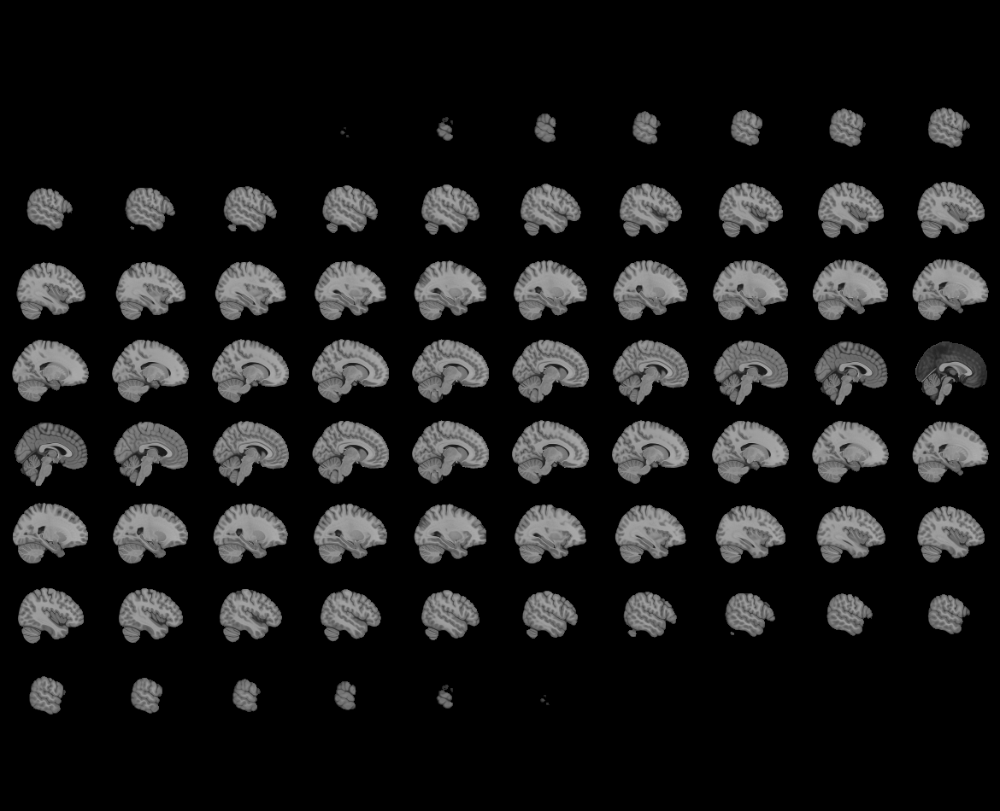
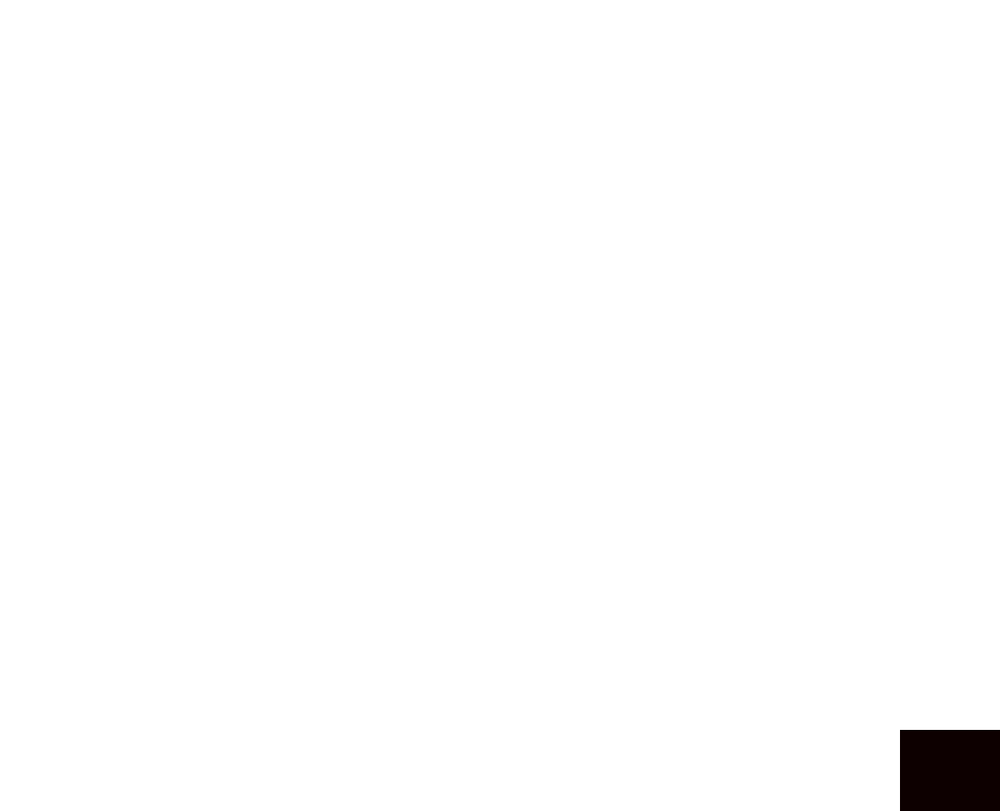

In [121]:
view = plotting.view_img(mni_mask_resampled)
view

In [6]:
# output_file_path = r"F:\yujun\projects\IAPS_Searchlight\data\masks\gist_mask.nii.gz"
output_file_path = r"F:\yujun\projects\data\masks\mask_799579.nii.gz"

# Save the visual mask image as a .nii.gz file
mni_mask_resampled.to_filename(output_file_path)


# Load activations 

In [12]:
dataDir = '../GLM/betas/'
# subs = os.listdir(dataDir)
# subs

In [5]:
subs = ['Sub1',
 'Sub2',
 'Sub3',
 'Sub4',
 'Sub5',
 'Sub6',
 'Sub7',
 'Sub8',
 'Sub9'
 ]
subs

['Sub1', 'Sub2', 'Sub3', 'Sub4', 'Sub5', 'Sub6', 'Sub7', 'Sub8', 'Sub9']

In [6]:
run_count = 10 # 1 to 10 runs

pl_na_idx = [12*x  for x in range(run_count)]
nt_na_idx = [12*x + 1 for x in range(run_count)]
up_na_idx = [12*x + 2 for x in range(run_count)]
pl_ai_idx = [12*x + 3 for x in range(run_count)]
nt_ai_idx = [12*x + 4 for x in range(run_count)]
up_ai_idx = [12*x + 5 for x in range(run_count)]

In [23]:
cond_dict = dict(zip(['pl_na','nt_na','up_na','pl_ai','nt_ai','up_ai'],[pl_na_idx, nt_na_idx, up_na_idx, pl_ai_idx, nt_ai_idx, up_ai_idx]))

In [10]:
nii_tmp.get_fdata().shape

(79, 95, 79)

In [36]:
from tqdm import tqdm 
sub_betas = []
for s in range(len(subs)):
    subdir = os.path.join(dataDir, subs[s])
    niifilenames = os.listdir(subdir)
    cond_betas = []
    for c, (k,run_ids) in enumerate(tqdm(cond_dict.items())):
        trial_betas = []
        for run_id in run_ids:
            # Load the NIfTI file
            file_path = os.path.join(subdir, niifilenames[run_id])
            nii_data = nib.load(file_path)

            beta = nii_data.get_fdata() * mni_mask_resampled.get_fdata()
            trial_betas.append(np.array(beta))
        cond_betas.append(np.array(trial_betas))
    sub_betas.append(np.array(cond_betas))

100%|██████████| 6/6 [00:01<00:00,  3.96it/s]


In [37]:
allbetas_allvoxel = np.array(sub_betas)
allbetas_allvoxel.shape

(9, 6, 10, 79, 95, 79)

In [39]:
allbetas_allvoxel_flat = allbetas_allvoxel.reshape(len(subs),6,-1)
allbetas_allvoxel_flat.shape

(9, 6, 5928950)

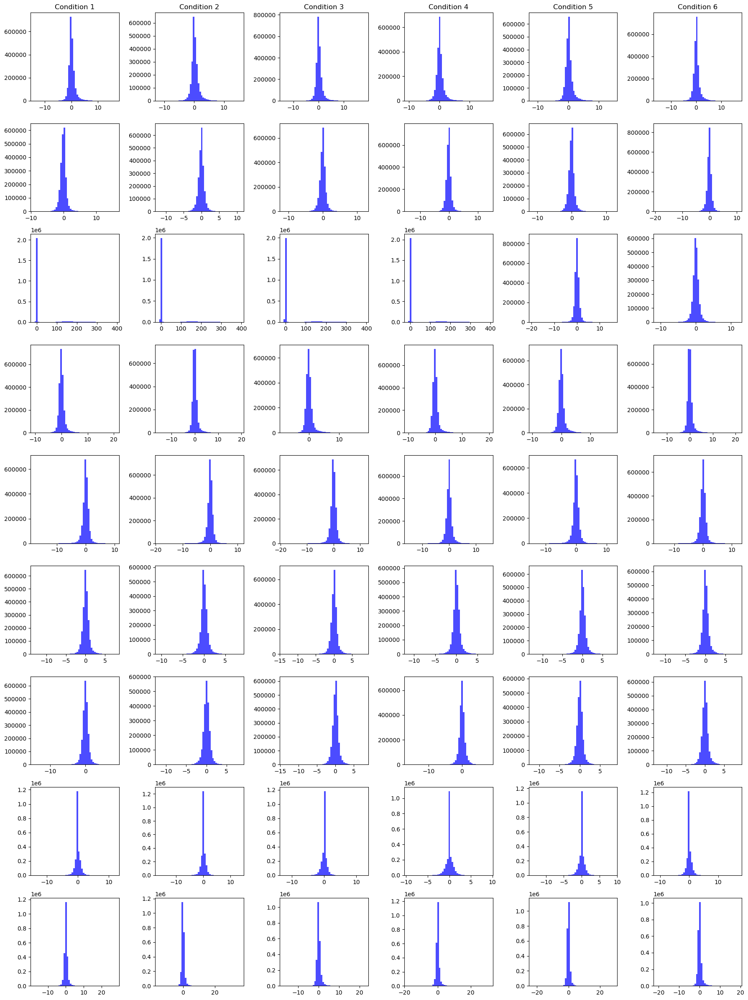

In [40]:
# Set up the plot
fig, axes = plt.subplots(9, 6, figsize=(18, 24))

for i in range(9):  # Loop over subjects
    for j in range(6):  # Loop over conditions
        ax = axes[i, j]
        
        # Extract the data for the current subject and condition
        data_for_plot = allbetas_flat[i, j, :]
        
        # Plot the distribution with a histogram
        ax.hist(data_for_plot, bins=50, color='blue', alpha=0.7)

        # Set the title and labels
        if i == 0:
            ax.set_title(f'Condition {j+1}', size=12)
        if j == 0:
            ax.set_ylabel(f'Subject {i+1}', size=12)

        # Remove x and y labels for cleanliness
        ax.set_xlabel('')
        ax.set_ylabel('')
        
plt.tight_layout()
plt.show()

Save betas

In [41]:
np.save("./data/betas_9subs.npy", allbetas_allvoxel)

Load betas

In [9]:
allbetas_allvoxel = np.load("./data/betas_9subs.npy")

# Flip angle comparisons

In [51]:
np.count_nonzero(~np.isnan(allbetas_allvoxel))

137325504

In [52]:
mean_signals.shape

(9, 6, 10)

In [53]:
np.count_nonzero(~np.isnan(mean_signals))

0

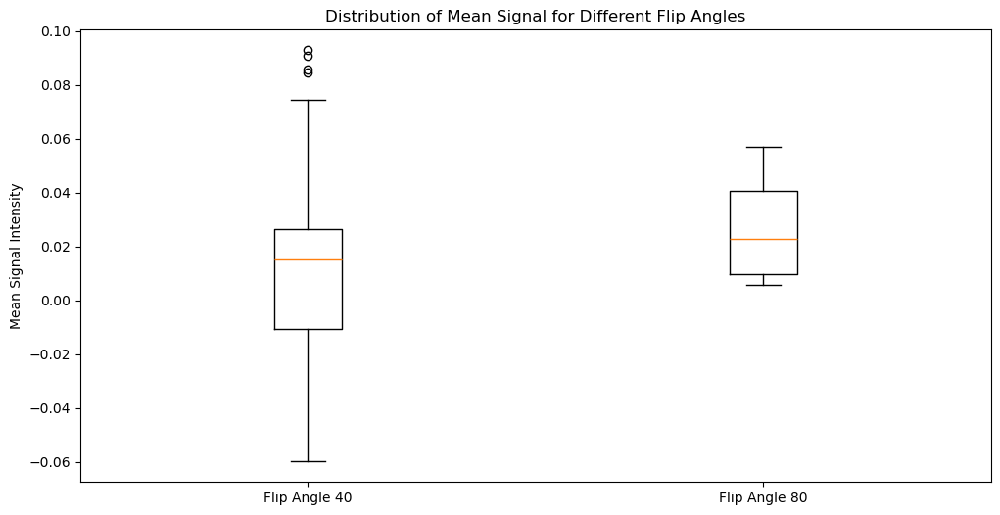

In [54]:
allbetas_allvoxel_nonan = np.nan_to_num(allbetas_allvoxel, nan=0)
mean_signals = np.mean(allbetas_allvoxel_nonan, axis=(3, 4, 5))  # Resulting shape: (9, 6, 10)

# Separate the subjects based on flip angle
mean_signals_flip40 = np.delete(mean_signals[:7, :, :], 2, axis=0)  # Shape: (6, 6, 10)
mean_signals_flip80 = mean_signals[7:, :, :]  # Last 2 subjects with flip angle 80

# Calculate the mean signal across repetitions for each condition and subject
mean_signals_flip40 = mean_signals_flip40.mean(axis=2)  # Shape: (7, 6)
mean_signals_flip80 = mean_signals_flip80.mean(axis=2)  # Shape: (2, 6)

# Plot the distributions
plt.figure(figsize=(12, 6))
plt.boxplot([mean_signals_flip40.flatten(), mean_signals_flip80.flatten()],
            labels=['Flip Angle 40', 'Flip Angle 80'])
plt.title('Distribution of Mean Signal for Different Flip Angles')
plt.ylabel('Mean Signal Intensity')
plt.show()

# First level t-test

In [42]:
allbetas_allvoxel.shape


(9, 6, 10, 79, 95, 79)

In [43]:
allbetas = allbetas_allvoxel.reshape(len(subs), allbetas_allvoxel.shape[1]*allbetas_allvoxel.shape[2], 79, 95, 79)

In [12]:
import numpy as np
from scipy.stats import ttest_1samp

# Assuming 'measure' is your array with shape (7, 600, 79, 95, 79)
# Perform t-tests for each subject and condition
t_values = np.zeros((7, 6, 79, 95, 79))  # Assuming 6 conditions
p_values = np.zeros((7, 6, 79, 95, 79)) 

for subj in range(7):
    for condition_idx in range(6):
        # Calculate the start and end indices for the current condition
        start_idx = condition_idx * 10
        end_idx = (condition_idx + 1) * 10

        # Extract the data for the current condition
        condition_data = allbetas[subj, start_idx:end_idx]

        # Perform the t-test for each voxel
        for i in range(79):
            for j in range(95):
                for k in range(79):
                    t_value, p_value = ttest_1samp(condition_data[:, i, j, k], 0)
                    t_values[subj, condition_idx, i, j, k] = t_value
                    p_values[subj, condition_idx, i, j, k] = p_value


In [21]:
condition_data.shape

(10, 79, 95, 79)

In [20]:
t_values.shape

(7, 6, 79, 95, 79)

# Second level analysis

In [ ]:
from statsmodels.stats.multitest import multipletests


# Reshape t_values to have subjects as the first dimension
t_values_reshaped = np.transpose(t_values, axes=(1, 0, 2, 3, 4)) # (6, 7, 79, 95, 79)

t_values_conds = np.zeros_like(t_values[0]) # (6, 79, 95, 79))
# Initialize arrays to store corrected p-values, significant voxels, and t-values of significant voxels
p_values_corrected = np.zeros_like(t_values[0]) # (6, 79, 95, 79))
significant_voxels = np.zeros_like(t_values[0], dtype=bool) # (6, 79, 95, 79))
t_values_significant = np.zeros_like(t_values[0]) # (6, 79, 95, 79))

# Loop through conditions
for cond_idx in range(t_values_reshaped.shape[0]):
    # Perform one-sample t-test against 0 for each voxel across subjects
    t_values_subs = t_values_reshaped[cond_idx] # (7, 79, 95, 79)
    p_values_cond = np.zeros_like(t_values_subs[cond_idx])
    t_values_cond = np.zeros_like(t_values_subs[cond_idx])
    for i in range(t_values_subs.shape[1]):
        for j in range(t_values_subs.shape[2]):
            for k in range(t_values_subs.shape[3]):
                t_values_cond[i, j, k], p_values_cond[i, j, k] = ttest_1samp(t_values_subs[:, i, j, k], 0)
    

    t_values_conds[cond_idx] = t_values_cond
    # Apply False Discovery Rate (FDR) correction
    p_values_corrected_cond = multipletests(p_values_cond.ravel(), alpha=0.05, method='fdr_bh')[1]
    p_values_corrected_cond = p_values_corrected_cond.reshape(p_values_cond.shape) #(79, 95, 79)
    
    # Store corrected p-values and significant voxels
    p_values_corrected[cond_idx] = p_values_corrected_cond #(6, 79, 95, 79))
    significant_voxels[cond_idx] = p_values_corrected_cond < 0.05  # Adjust alpha as needed #(6, 79, 95, 79))
    
    # Save t-values of significant voxels
    t_values_significant[cond_idx][significant_voxels[cond_idx]] = t_values_cond[significant_voxels[cond_idx]]


Plots

In [40]:
t_values.shape

(7, 6, 79, 95, 79)

In [41]:
t_values_significant.shape

(6, 79, 95, 79)

In [50]:
np.count_nonzero(t_values_significant[4])

0

In [28]:
conditions = ['pleasant', 'neutral', 'unpleasant', 'pleasantAI', 'neutralAI', 'unpleasantAI']

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_stat_map.py:219: FutureWarning: Default resolution of the MNI template will change from 2mm to 1mm in version 0.10.0
  bg_img = load_mni152_template()



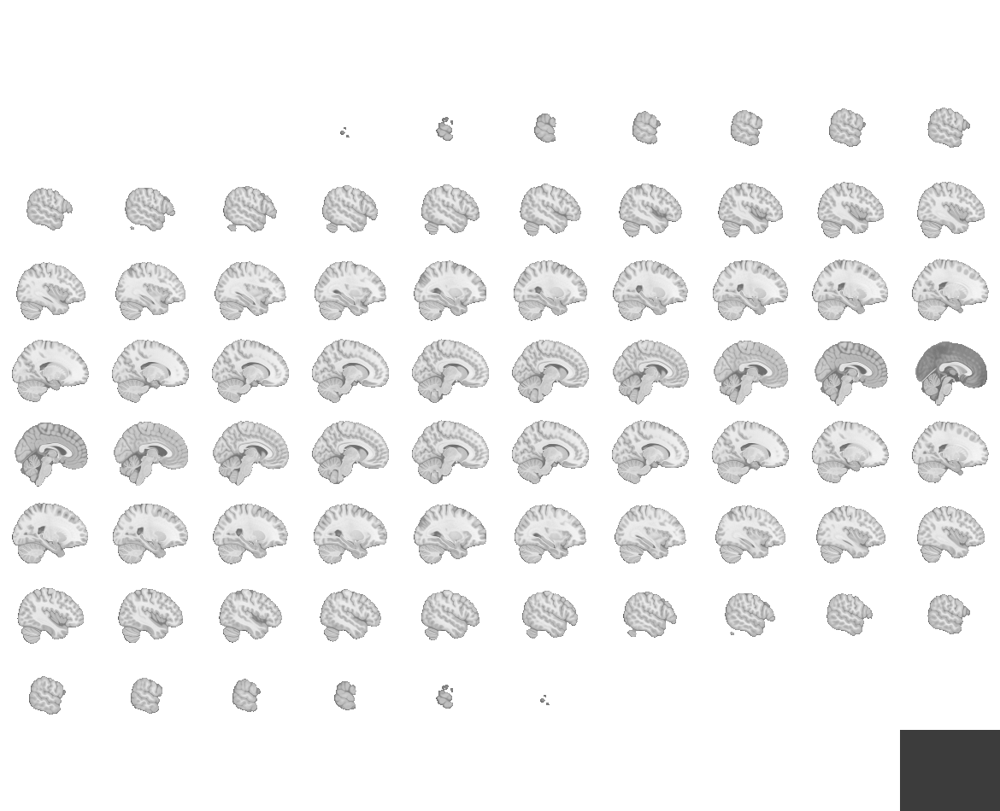
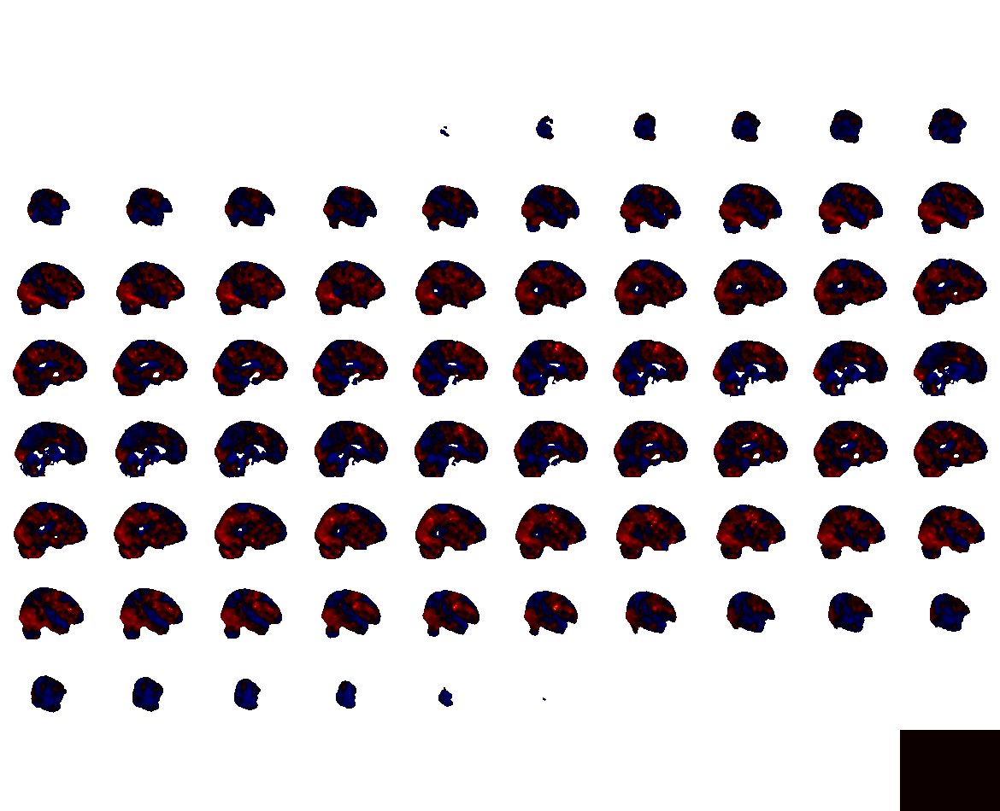

In [30]:
c = 0
t_img = new_img_like(nii_tmp, t_values_conds[c])
view = plotting.view_img(t_img, title = f"{conditions[c]}", draw_cross = False, black_bg = False)
view

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\_utils\param_validation.py:72: UserWarning: The given float value must not exceed 0.0. But, you have given threshold=1e-06 
  warnings.warn("The given float value must not exceed {0}. "
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\find_cuts.py:69: UserWarning: Given img is empty. Returning default cut_coords=(0.0, 0.0, 0.0) instead.
  warnings.warn(



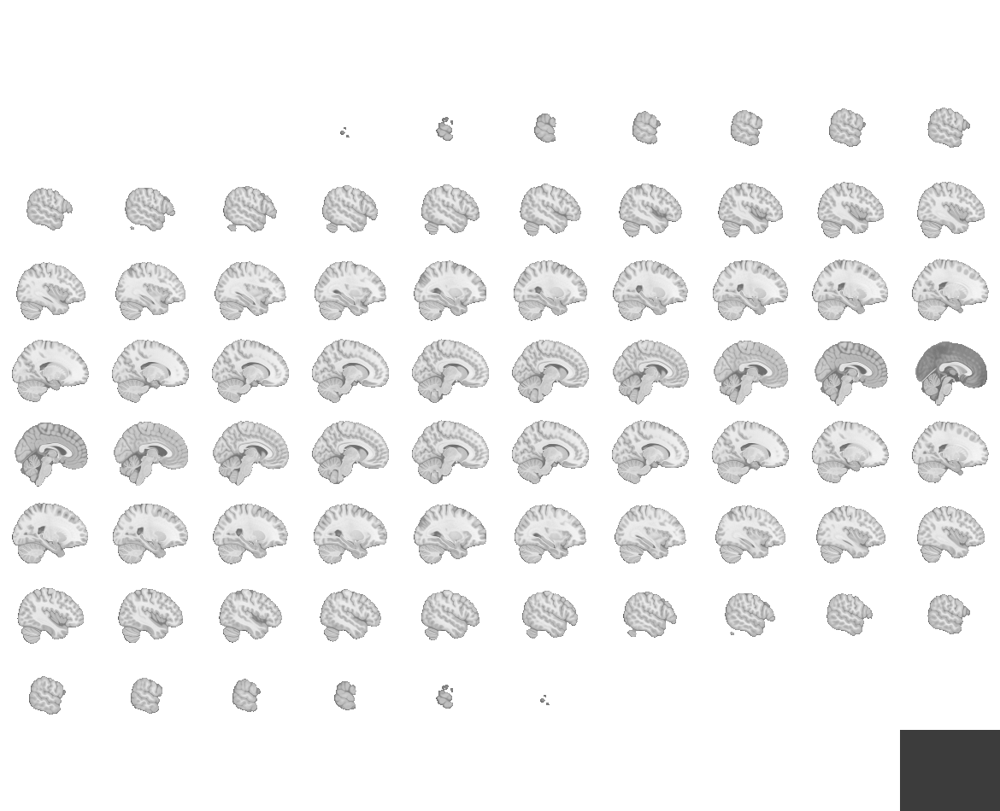
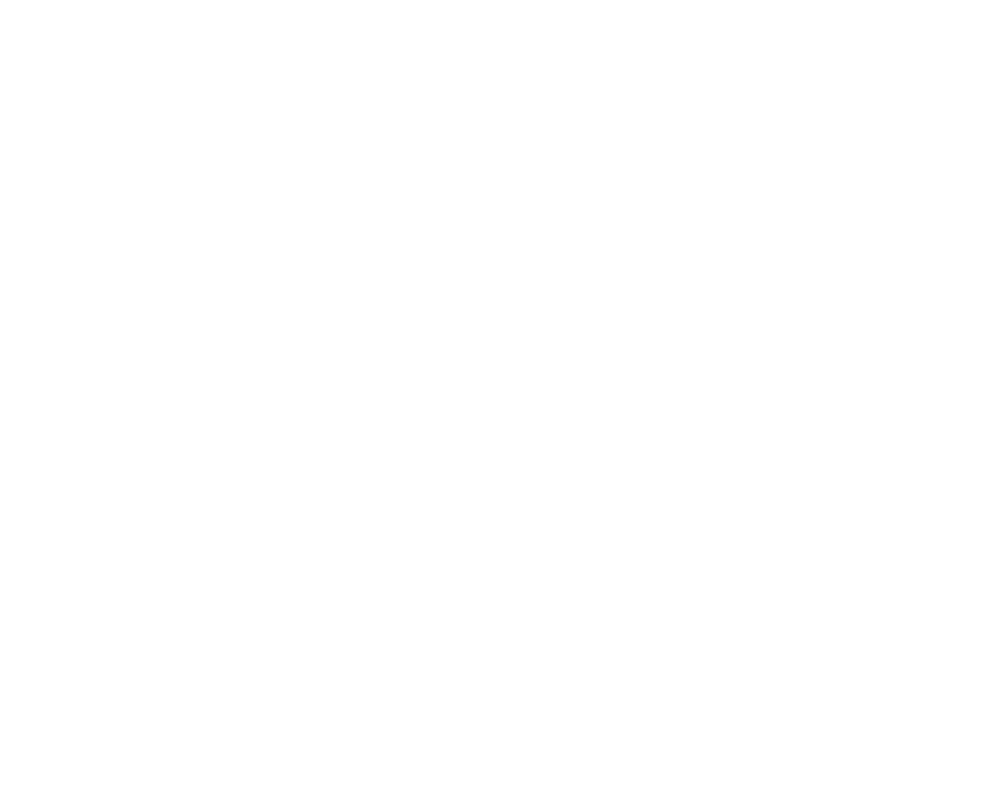

In [44]:
c = 0
t_img = new_img_like(nii_tmp, t_values_significant[c])
view = plotting.view_img(t_img, title = f"{conditions[c]}", draw_cross = False, black_bg = False)
view

After correction, no significant voxels left.

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(



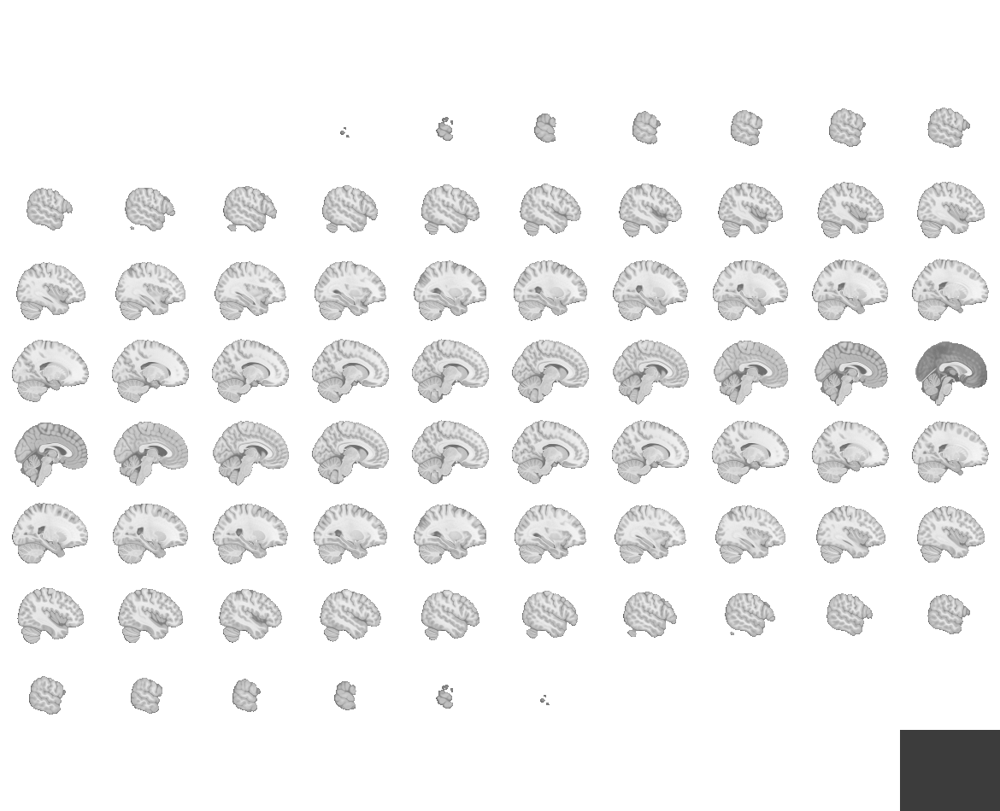
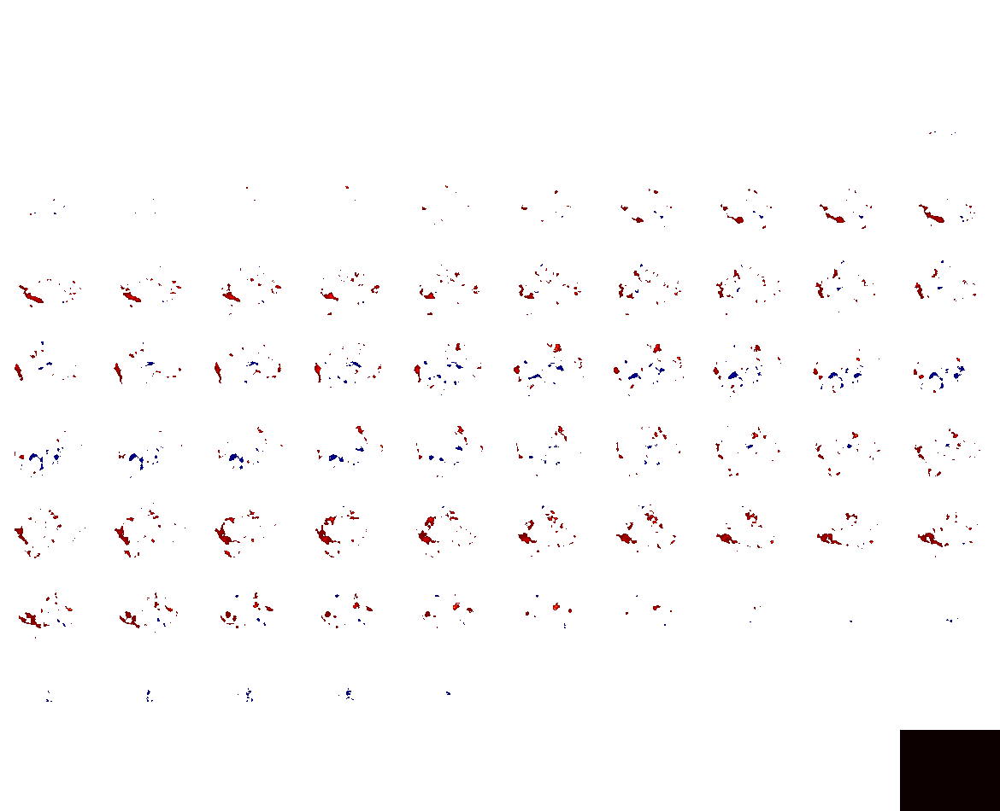

In [51]:
c = 0
t_img = new_img_like(nii_tmp, t_values_conds[c])
view = plotting.view_img(t_img, title = f"{conditions[c]}", threshold=3, draw_cross = False, black_bg = False)
view

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(



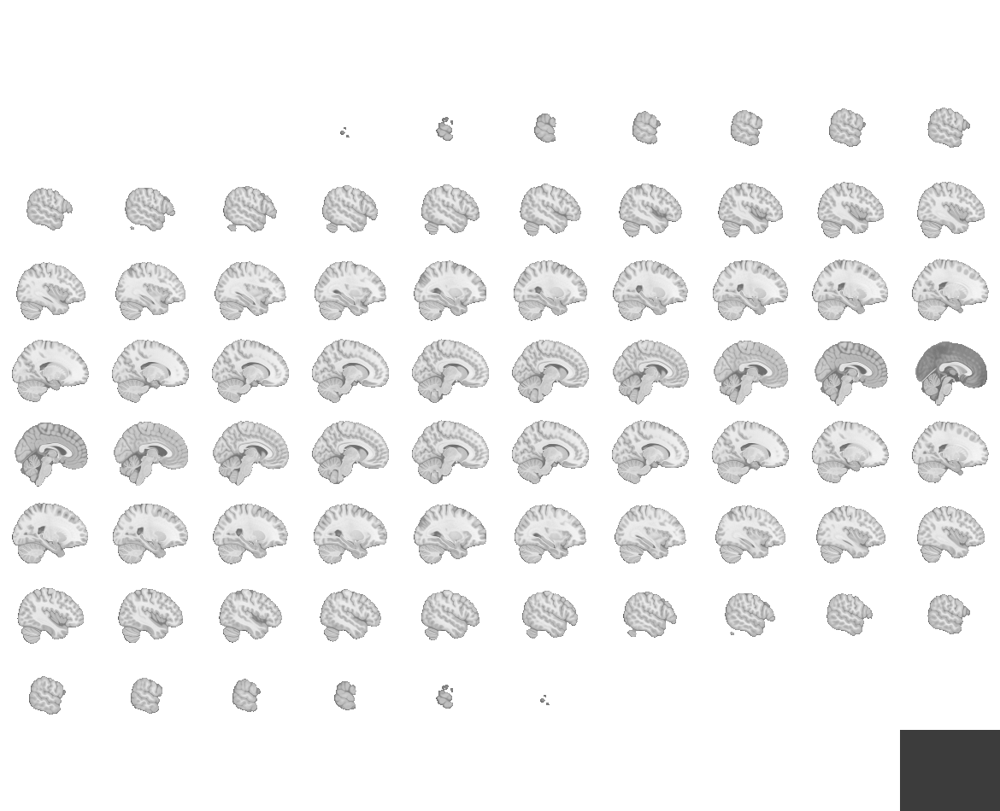
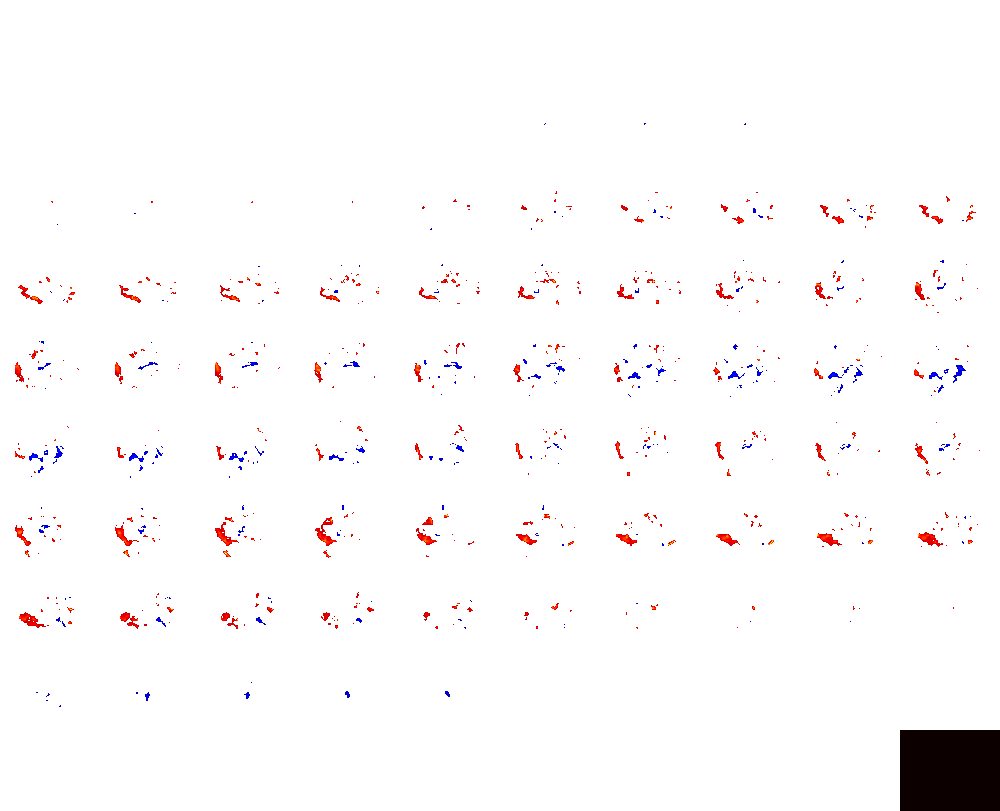

In [53]:
c = 3
t_img = new_img_like(nii_tmp, t_values_conds[c])
view = plotting.view_img(t_img, title = f"{conditions[c]}", threshold=3, draw_cross = False, black_bg = False)
view

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(



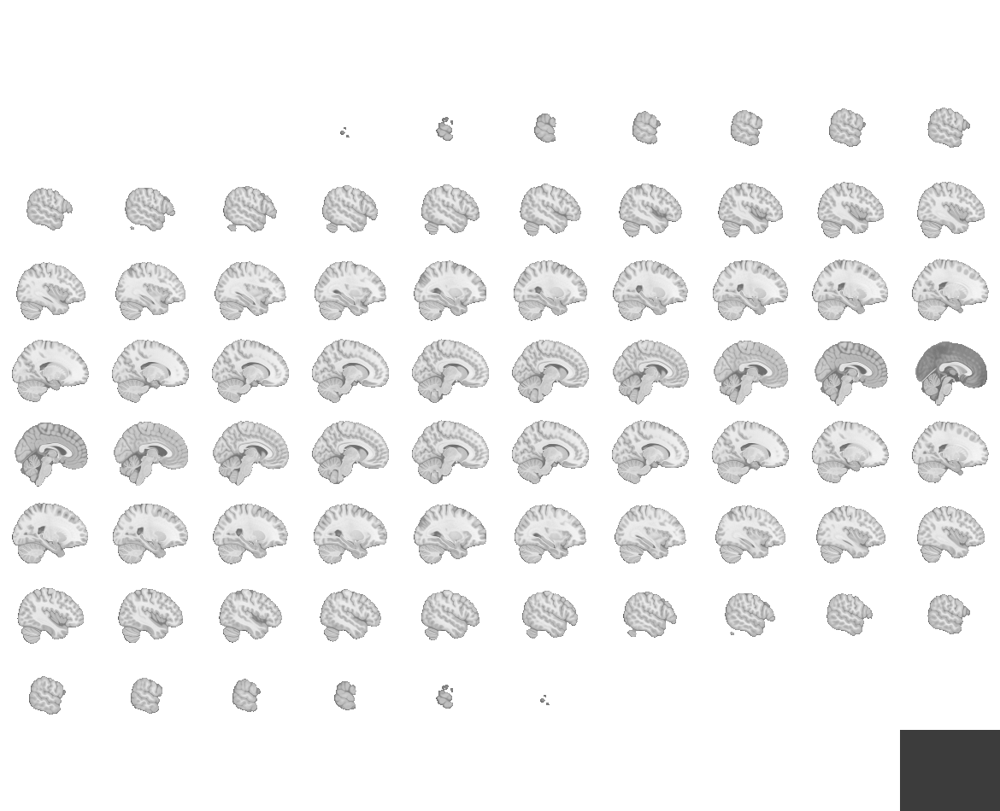
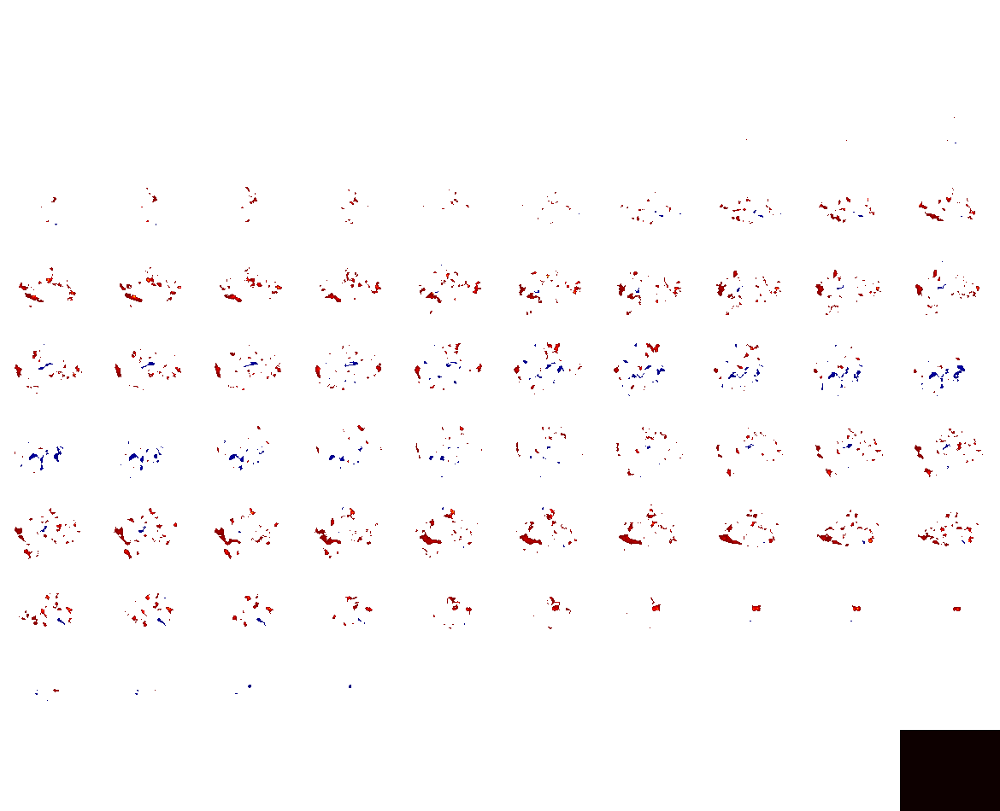

In [52]:
c = 1
t_img = new_img_like(nii_tmp, t_values_conds[c])
view = plotting.view_img(t_img, title = f"{conditions[c]}", threshold=3, draw_cross = False, black_bg = False)
view

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(



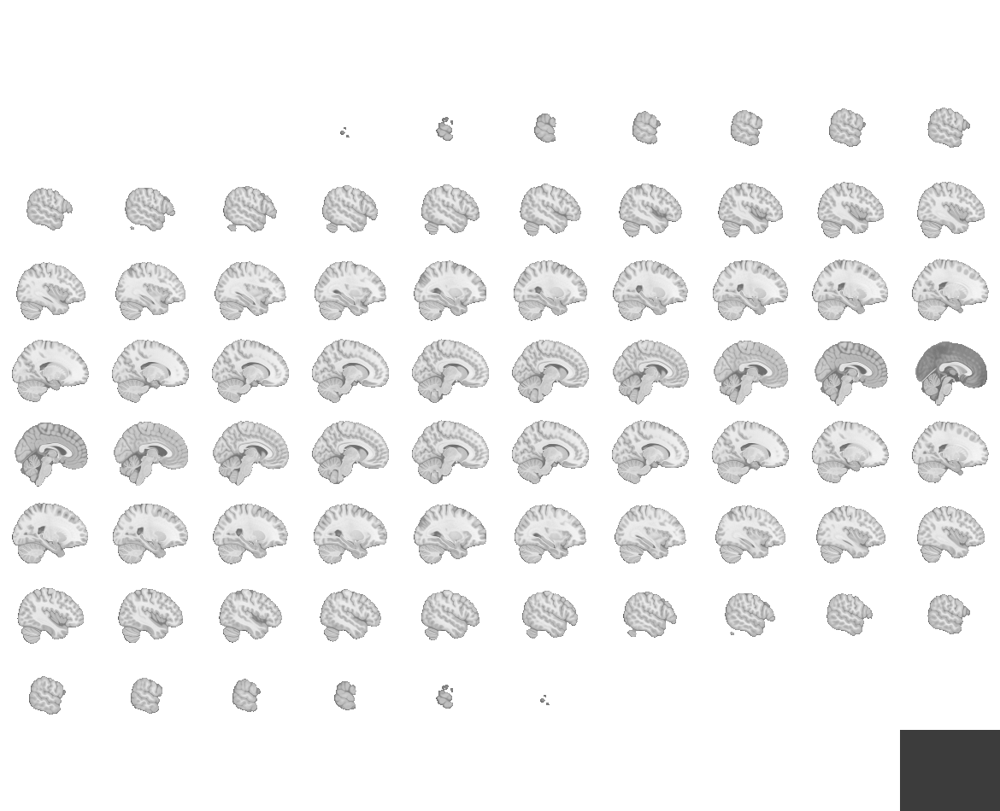
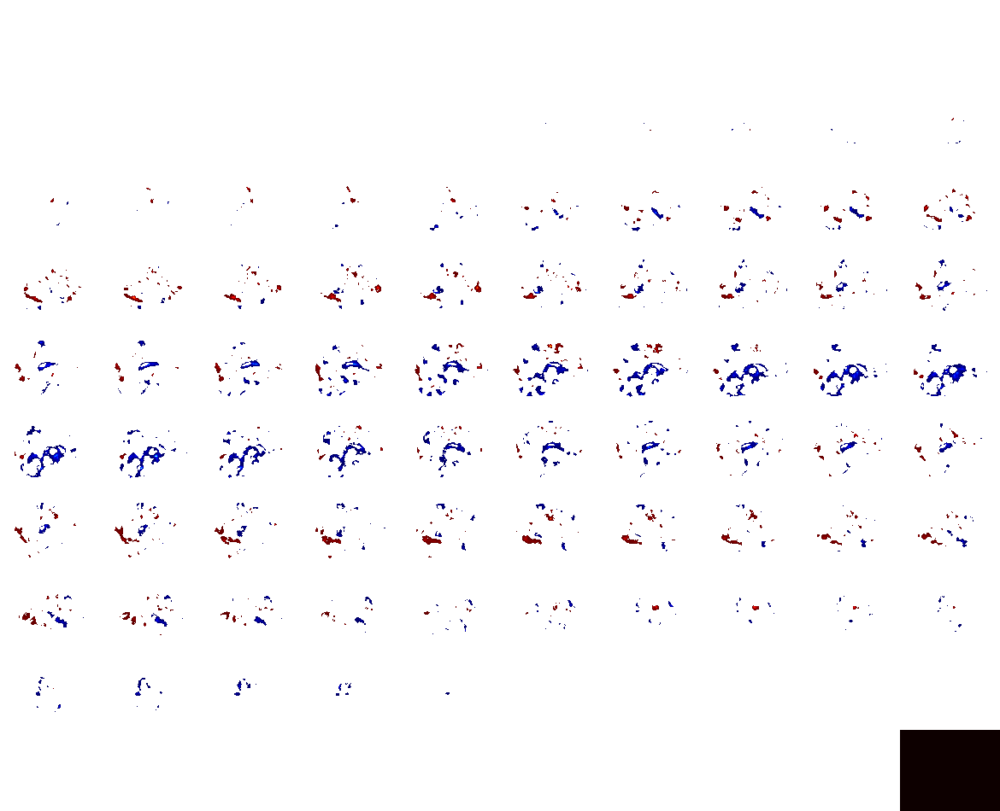

In [54]:
c = 4
t_img = new_img_like(nii_tmp, t_values_conds[c])
view = plotting.view_img(t_img, title = f"{conditions[c]}", threshold=3, draw_cross = False, black_bg = False)
view

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(



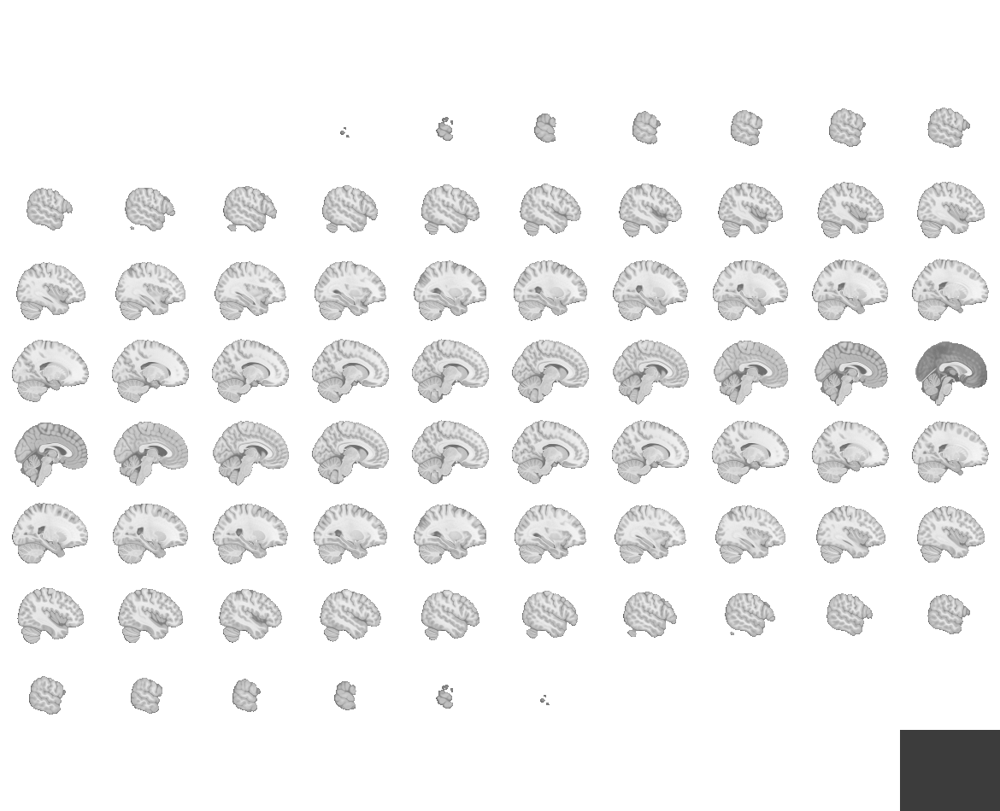
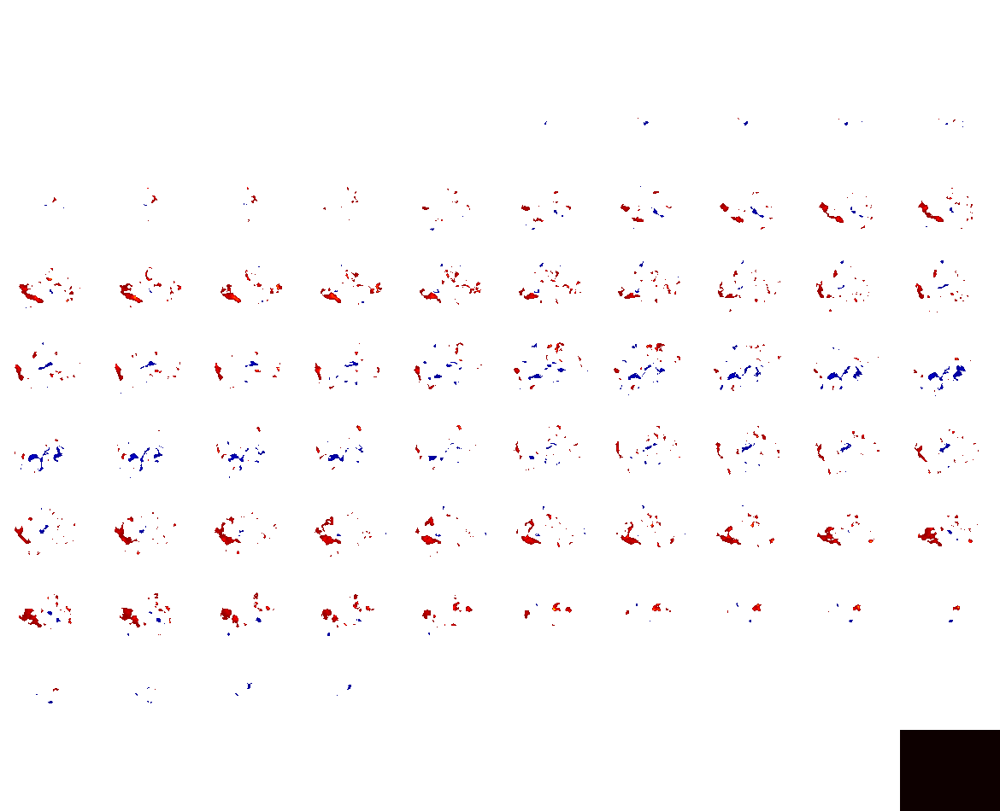

In [55]:
c = 2
t_img = new_img_like(nii_tmp, t_values_conds[c])
view = plotting.view_img(t_img, title = f"{conditions[c]}", threshold=3, draw_cross = False, black_bg = False)
view

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\_utils\niimg.py:63: UserWarning: Non-finite values detected. These values will be replaced with zeros.
  warn(



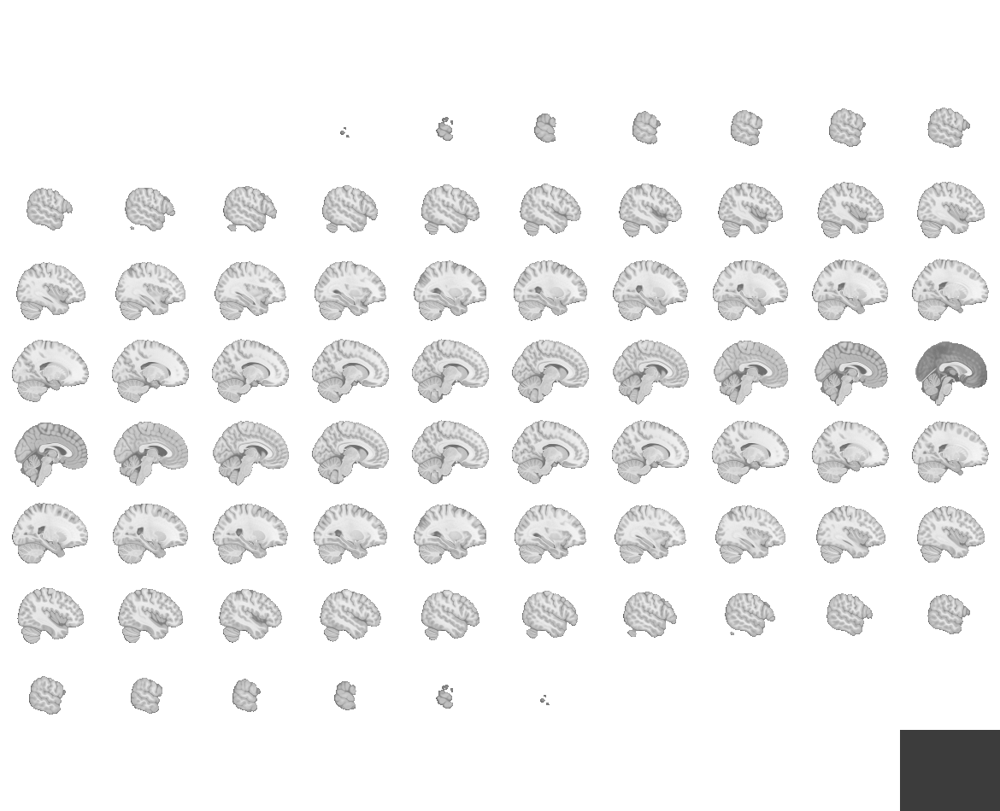
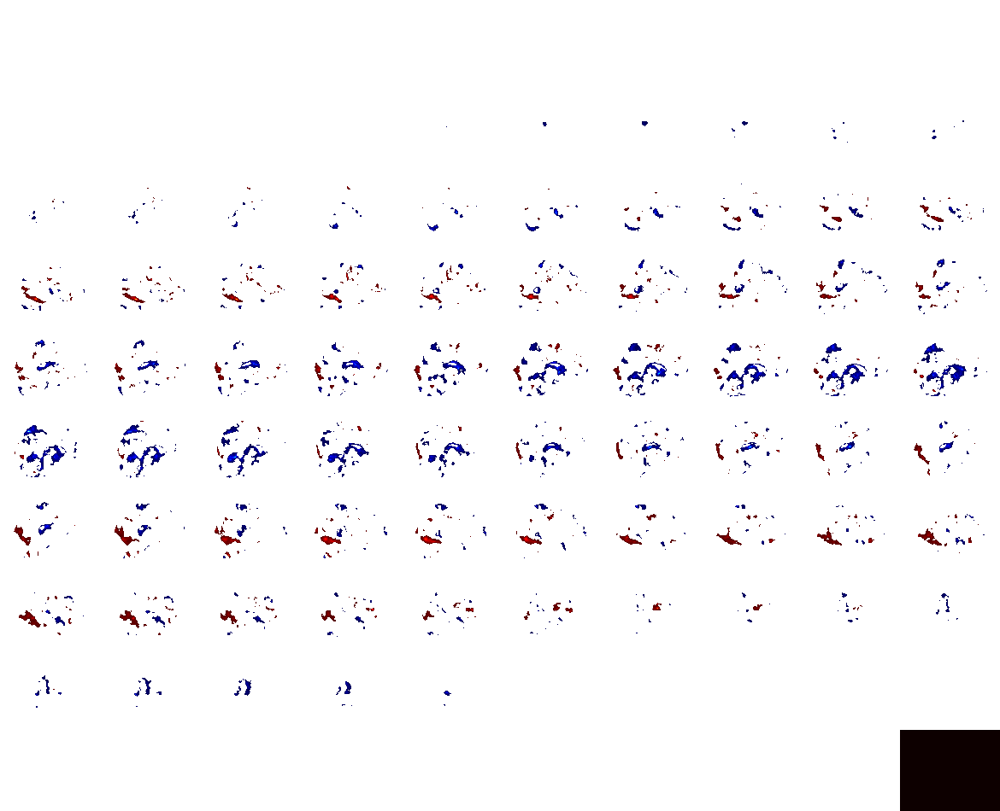

In [56]:
c = 5
t_img = new_img_like(nii_tmp, t_values_conds[c])
view = plotting.view_img(t_img, title = f"{conditions[c]}", threshold=3, draw_cross = False, black_bg = False)
view

# Define ROIs

In [124]:
aal_rois_files = ['ACCpre',
 'ACCsub',
 'ACCsup',
 'Amygdala',
 'Angular',
 'Calcarine',
 'Caudate',
 'Cerebellum',
 'Cuneus',
 'FrontalInfOper',
 'FrontalInfOrb',
 'FrontalInfTri',
 'FrontalMedOrb',
 'FrontalMid',
 'FrontalSup',
 'FrontalSupMedial',
 'Fusiform',
 'Heschl',
 'Hippocampus',
 'Insula',
 'LC',
 'Lingual',
 'NAcc',
 'OccipitalInf',
 'OccipitalMid',
 'OccipitalSup',
 'OFCant',
 'OFClat',
 'OFCmed',
 'OFCpost',
 'Pallidum',
 'ParacentralLobule',
 'ParaHippocampal',
 'ParietalInf',
 'ParietalSup',
 'Postcentral',
 'Precentral',
 'Precuneus',
 'Putamen',
 'RedN',
 'RolandicOper',
 'SNpc',
 'SNpr',
 'SuppMotorArea',
 'SupraMarginal',
 'TemporalInf',
 'TemporalMid',
 'TemporalPoleMid',
 'TemporalPoleSup',
 'TemporalSup',
 'ThalAV',
 'ThalIL',
 'ThalLGN',
 'ThalLP',
 'ThalMDl',
 'ThalMDm',
 'ThalMGN',
 'ThalPuA',
 'ThalPuI',
 'ThalPuL',
 'ThalPuM',
 'ThalRe',
 'ThalVA',
 'ThalVL',
 'ThalVPL']

In [125]:
# aal_rois_files = os.listdir("F:\yujun\projects\data\masks\AAL3\\new")
aal_rois = [string.split('.')[0] for string in aal_rois_files]
aal_rois

['ACCpre',
 'ACCsub',
 'ACCsup',
 'Amygdala',
 'Angular',
 'Calcarine',
 'Caudate',
 'Cerebellum',
 'Cuneus',
 'FrontalInfOper',
 'FrontalInfOrb',
 'FrontalInfTri',
 'FrontalMedOrb',
 'FrontalMid',
 'FrontalSup',
 'FrontalSupMedial',
 'Fusiform',
 'Heschl',
 'Hippocampus',
 'Insula',
 'LC',
 'Lingual',
 'NAcc',
 'OccipitalInf',
 'OccipitalMid',
 'OccipitalSup',
 'OFCant',
 'OFClat',
 'OFCmed',
 'OFCpost',
 'Pallidum',
 'ParacentralLobule',
 'ParaHippocampal',
 'ParietalInf',
 'ParietalSup',
 'Postcentral',
 'Precentral',
 'Precuneus',
 'Putamen',
 'RedN',
 'RolandicOper',
 'SNpc',
 'SNpr',
 'SuppMotorArea',
 'SupraMarginal',
 'TemporalInf',
 'TemporalMid',
 'TemporalPoleMid',
 'TemporalPoleSup',
 'TemporalSup',
 'ThalAV',
 'ThalIL',
 'ThalLGN',
 'ThalLP',
 'ThalMDl',
 'ThalMDm',
 'ThalMGN',
 'ThalPuA',
 'ThalPuI',
 'ThalPuL',
 'ThalPuM',
 'ThalRe',
 'ThalVA',
 'ThalVL',
 'ThalVPL']

# Plot average beta across subject in all ROIs


In [228]:
aal3_bins = []
aal3_masks = []

for i in range(len(aal_rois)):
    aal3_nii = nib.load(f'F:\yujun\projects\data\masks\AAL3\\new\{aal_rois[i]}.nii.gz')
    aal3_resample = resample_img(aal3_nii, target_affine=nii_tmp.affine, target_shape=nii_tmp.shape)
    aal3_bin = np.where(aal3_resample.get_fdata() > 0, 1, 0)
    aal3_masks.append(nib.Nifti1Image(aal3_bin, nii_tmp.affine))
    
aal3_dict = dict(zip(aal_rois, aal3_masks))

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\image\resampling.py:545: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\image\resampling.py:274: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn("Resampling binary images with continuous or "
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of 


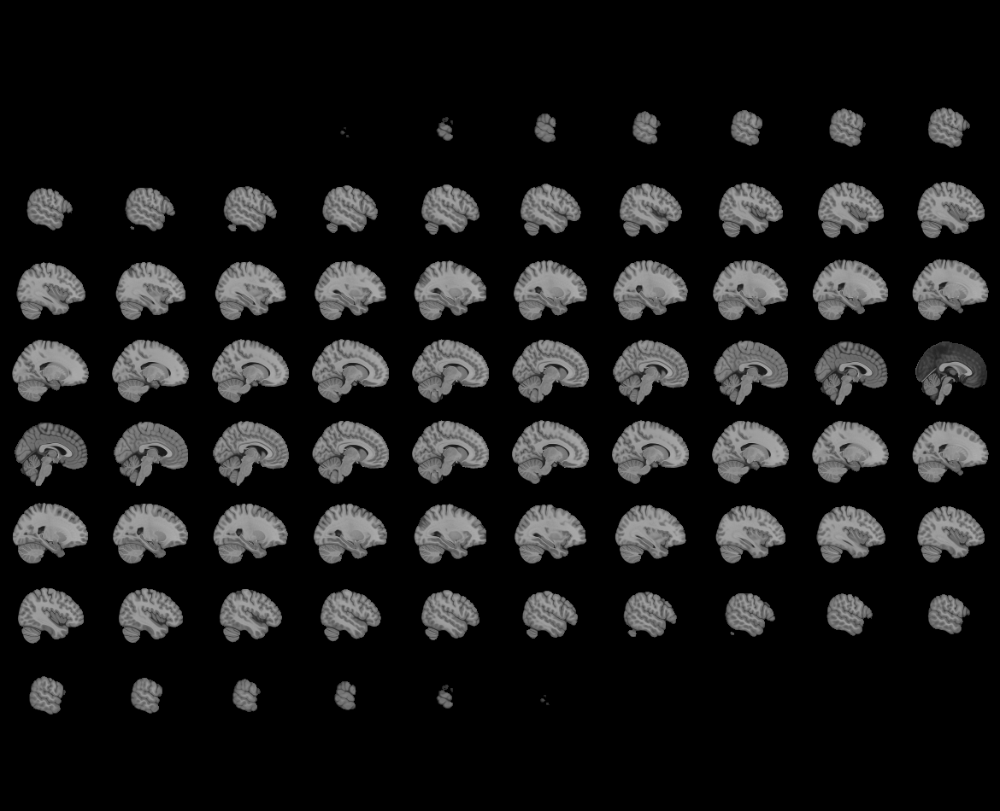
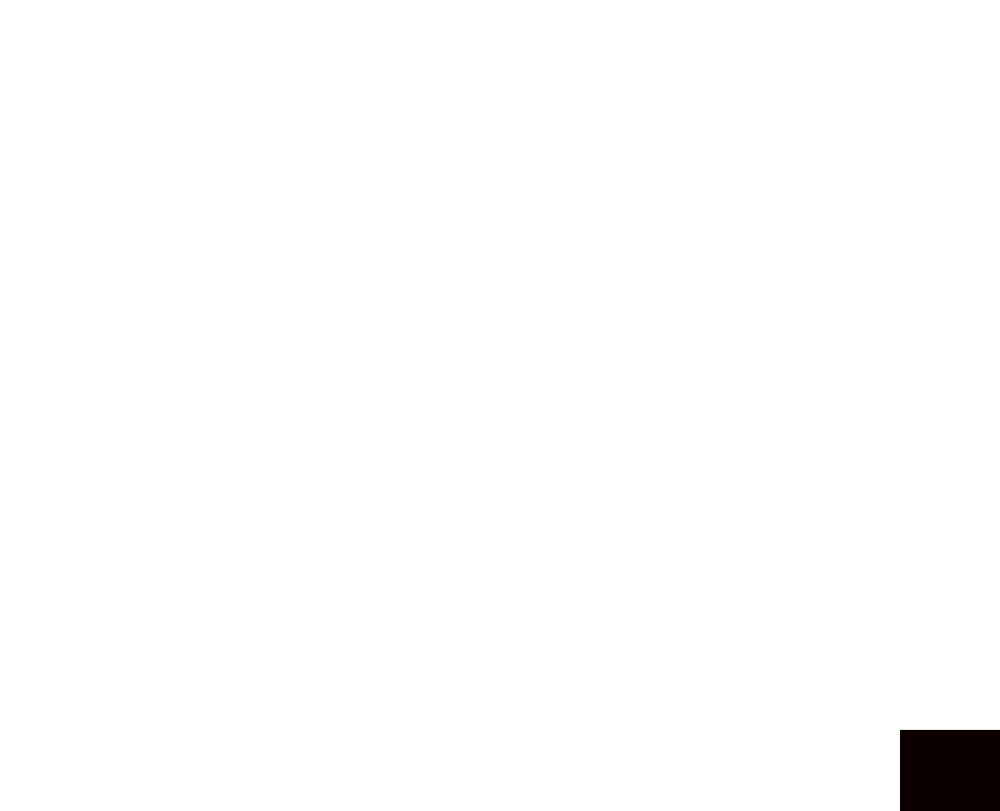

In [229]:
roi = "Cuneus"

view = plotting.view_img(aal3_dict[roi], title = roi)
view

In [134]:
# from tqdm import tqdm 

# roi_betas = []
# for r, (roi, mask) in enumerate(aal3_dict.items()):
#     sub_betas = []
#     for s in tqdm(range(len(subs))):
#         subdir = os.path.join(dataDir, subs[s])
#         niifilenames = os.listdir(subdir)
#         cond_betas = []
#         for c, (k,beta_ids) in enumerate(cond_dict.items()):
#             trial_betas = []
#             for beta_id in beta_ids:
#                 roi_betas = []
            
#                 # Load the NIfTI file
#                 file_path = os.path.join(subdir, niifilenames[beta_id])
#                 nii_data = nib.load(file_path)

#                 beta = masking.apply_mask(nii_data, mask)
#                 mean_beta = np.average(beta)

#                 trial_betas.append(roi_betas)
#             cond_betas.append(trial_betas)
#         sub_betas.append(cond_betas)
#     roi_betas.append(cond_betas)

In [230]:
from tqdm import tqdm 
sub_betas = []
for s in range(len(subs)):
    subdir = os.path.join(dataDir, subs[s])
    niifilenames = os.listdir(subdir)
    cond_betas = []
    for c, (k,run_ids) in enumerate(tqdm(cond_dict.items())):
        trial_betas = []
        for run_id in run_ids:
            roi_betas = []
            for roi, mask in aal3_dict.items():
                # Load the NIfTI file
                file_path = os.path.join(subdir, niifilenames[run_id])
                nii_data = nib.load(file_path)

                beta = masking.apply_mask(nii_data, mask)
                mean_beta = np.mean(beta)

                roi_betas.append(mean_beta)
            trial_betas.append(np.array(roi_betas))
        cond_betas.append(np.array(trial_betas))
    sub_betas.append(np.array(cond_betas))

  0%|          | 0/6 [01:11<?, ?it/s]


KeyboardInterrupt: 

In [ ]:
sub_betas_arr = np.array(sub_betas)

In [ ]:
sub_betas_arr.shape

(7, 6, 10, 65)

In [ ]:
# mean_subjects_arr = np.mean(sub_betas_arr, axis=0)  # Mean across the subject dimension
# std_subjects_arr = np.std(sub_betas_arr, axis=0)    # Standard deviation across the subject dimension

# # Apply z-score transformation across subjects for each condition and ROI
# zscore_arr = (sub_betas_arr - mean_subjects_arr) / std_subjects_arr

Save all ROIs betas

In [ ]:
np.save("./outputs/betas_activation_map.npy", sub_betas_arr)

Load all ROIs beta

In [231]:
sub_betas_arr = np.load("./outputs/betas_activation_map.npy")

In [232]:
sub_betas_arr.shape

(7, 6, 10, 65)

In [236]:
trial_betas_arr_modified = np.delete(sub_betas_arr, 2, axis=0)
betas_arr_allrois = np.mean(trial_betas_arr_modified, axis=2)
# betas_arr = np.mean(betas_arr, axis=1)


In [237]:
betas_arr_allrois.shape

(6, 6, 65)

In [245]:
aal_rois[0]

'ACCpre'

<Figure size 640x480 with 0 Axes>

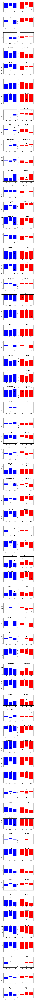

In [255]:
plt.tight_layout(pad=3.0)
# Define the number of conditions and ROIs
num_conditions = betas_arr_allrois.shape[1]
num_rois = betas_arr_allrois.shape[2]

# Calculate the mean across subjects for each condition and ROI
mean_conditions = np.mean(betas_arr_allrois, axis=0)

# Calculate the standard error across subjects for each condition and ROI
se_conditions = np.std(betas_arr_allrois, axis=0) / np.sqrt(betas_arr_allrois.shape[0])

# Create subplots
fig, axes = plt.subplots(num_rois, 2, figsize=(8, 4*num_rois))

for i in range(num_rois):
    for j in range(2):
        # Plot the conditions with error bars
        if j == 0:
            conditions = mean_conditions[:3, i]
            se = se_conditions[:3, i]
            conditions_label = 'First 3 Conditions'
            color = 'blue'
            xticklabels = ['pl_na', 'nt_na', 'up_na']
        else:
            conditions = mean_conditions[3:, i]
            se = se_conditions[3:, i]
            conditions_label = 'Last 3 Conditions'
            color = 'red'
            xticklabels = ['pl_ai', 'nt_ai', 'up_ai']


        bars = axes[i, j].bar(np.arange(1, 4), conditions, yerr=se, capsize=5, color=color)
        axes[i, j].set_title(f'{aal_rois[i]}', fontsize=14)

        # Set x-tick positions and labels
        axes[i, j].set_xticks(np.arange(1, 4))
        axes[i, j].set_xticklabels(xticklabels)

# Adjust spacing between rows
plt.subplots_adjust(hspace=0.5)

plt.show()

# Plot average beta across subject in specific ROIs

In [ ]:
aal3_all_nii = nib.load(f'F:\yujun\projects\data\masks\AAL3\AAL3v1.nii')
aal3_all_nii_resample = resample_img(aal3_all_nii, target_affine=nii_tmp.affine, target_shape=nii_tmp.shape)
amy_l = np.where(aal3_all_nii_resample.get_fdata() == 45, 1, 0)
amy_l_nii = nib.Nifti1Image(amy_l, nii_tmp.affine)
amy_r = np.where(aal3_all_nii_resample.get_fdata() == 46, 1, 0)
amy_r_nii = nib.Nifti1Image(amy_r, nii_tmp.affine)

In [ ]:
amy_dict = dict(zip(['amy_l','amy_r'],[amy_l_nii,amy_r_nii]))

In [214]:
view = plotting.view_img(amy_l_nii, title = roi)
view

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\numpy\core\fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\image\resampling.py:545: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))
c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\image\resampling.py:274: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn("Resampling binary images with continuous or "


In [151]:
from tqdm import tqdm 
amy_betas = []
for s in range(len(subs)):
    subdir = os.path.join(dataDir, subs[s])
    niifilenames = os.listdir(subdir)
    cond_betas = []
    for c, (k,run_ids) in enumerate(tqdm(cond_dict.items())):
        trial_betas = []
        for run_id in run_ids:
            roi_betas = []
            for roi, mask in amy_dict.items():
                # Load the NIfTI file
                file_path = os.path.join(subdir, niifilenames[run_id])
                nii_data = nib.load(file_path)

                beta = masking.apply_mask(nii_data, mask)
                mean_beta = np.mean(beta)

                roi_betas.append(mean_beta)
            trial_betas.append(np.array(roi_betas))
        cond_betas.append(np.array(trial_betas))
    amy_betas.append(np.array(cond_betas))

100%|██████████| 6/6 [01:10<00:00, 11.79s/it]


In [152]:
amy_betas_arr = np.array(amy_betas)
amy_betas_arr.shape

(7, 6, 10, 2)

In [185]:
amy_betas_arr2 = np.mean(amy_betas_arr, axis=2)
amy_betas_arr3 = np.delete(amy_betas_arr2, 2, axis=0)

amy_betas_arr4 = np.mean(amy_betas_arr3, axis=0)

print(f"Condition count: {amy_betas_arr4.shape[0]}" )
print(f"ROI count: {amy_betas_arr4.shape[1]}" )

Condition count: 6
ROI count: 2


In [215]:
amy_betas_arr3.shape

(6, 6, 2)

In [154]:
amy_betas_arr4

array([[0.10158855, 0.08420195],
       [0.05122086, 0.07340046],
       [0.1048617 , 0.07661131],
       [0.12497308, 0.08585995],
       [0.04661425, 0.08714911],
       [0.08756012, 0.04025619]], dtype=float32)

In [ ]:
list(amy_dict.keys())

['amy_l', 'amy_r']

In [216]:
amy_betas_arr4.shape

(6, 2)

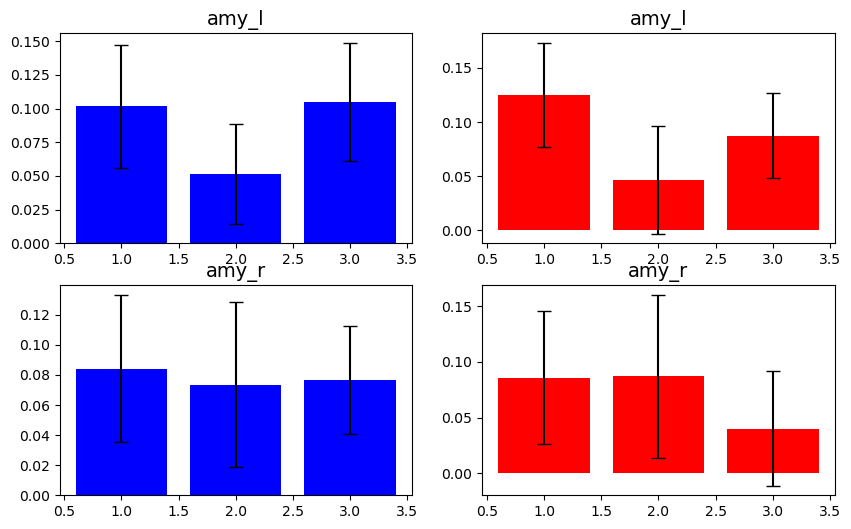

In [226]:
# Define the number of conditions and ROIs
num_conditions = amy_betas_arr3.shape[1]
num_rois = amy_betas_arr3.shape[2]

# Calculate the mean across subjects for each condition and ROI
mean_conditions = np.mean(amy_betas_arr3, axis=0)

# Calculate the standard error across subjects for each condition and ROI
se_conditions = np.std(amy_betas_arr3, axis=0) / np.sqrt(amy_betas_arr3.shape[0])

# Create subplots
fig, axes = plt.subplots(num_rois, 2, figsize=(10, 3*num_rois))

for i in range(num_rois):
    for j in range(2):
        # Plot the conditions with error bars
        if j == 0:
            conditions = mean_conditions[:3, i]
            se = se_conditions[:3, i]
            conditions_label = 'First 3 Conditions'
            color = 'blue'
            xticklabels = ['pl_na', 'nt_na', 'up_na']
        else:
            conditions = mean_conditions[3:, i]
            se = se_conditions[3:, i]
            conditions_label = 'Last 3 Conditions'
            color = 'red'
            xticklabels = ['pl_ai', 'nt_ai', 'up_ai']

        axes[i, j].bar(np.arange(1, 4), conditions, yerr=se, capsize=5, color=color)
        axes[i, j].set_title(f'{list(amy_dict.keys())[i]}', fontsize=14)
        axes[i, j].set_xticks


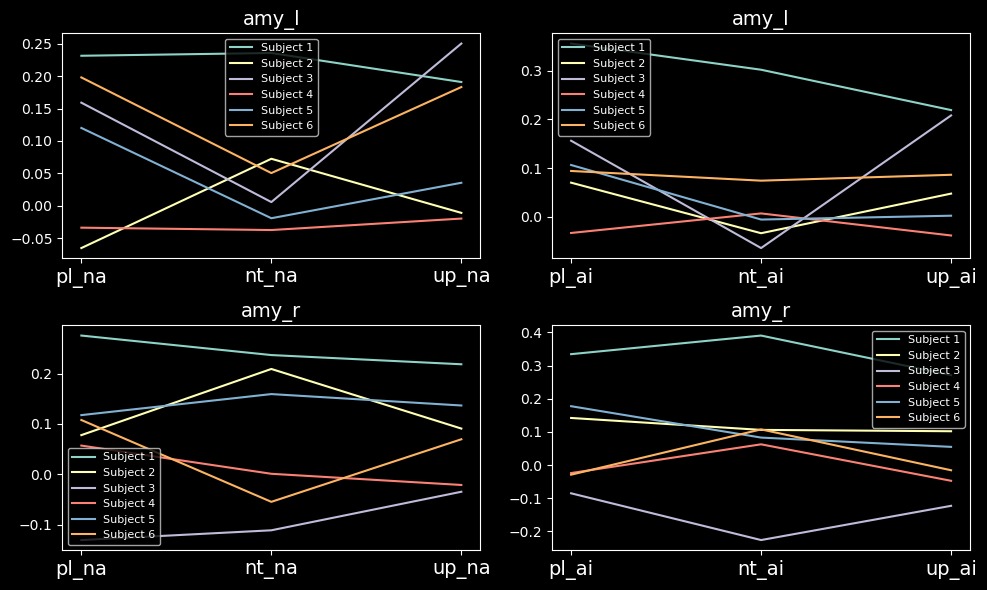

In [218]:
# Define the number of conditions and ROIs
num_conditions = amy_betas_arr3.shape[1]
num_rois = amy_betas_arr3.shape[2]

# Create subplots
fig, axes = plt.subplots(num_rois, 2, figsize=(10, 3*num_rois))

for i in range(num_rois):
    for j in range(2):
        # Plot the conditions for each subject
        if j == 0:
            conditions = amy_betas_arr3[:, :3, i]
            conditions_label = 'First 3 Conditions'
            xticklabels = ['pl_na', 'nt_na', 'up_na']
        else:
            conditions = amy_betas_arr3[:, 3:, i]
            conditions_label = 'Last 3 Conditions'
            xticklabels = ['pl_ai', 'nt_ai', 'up_ai']

        for s in range(amy_betas_arr3.shape[0]):
            axes[i, j].plot(np.arange(1, 4), conditions[s], label=f'Subject {s+1}')

        axes[i, j].set_title(f'{list(amy_dict.keys())[i]}', fontsize=14)
        axes[i, j].set_xticks(np.arange(1, 4))
        axes[i, j].set_xticklabels(xticklabels, fontsize=14)
        axes[i, j].legend(fontsize=8)

plt.tight_layout()
plt.show()

In [227]:
# END

# Plot single beta for a subject in one condition


In [ ]:
# for i in range(55):

#     file_path2 = f'F:\yujun\projects\AI_IAPS\GLM\\betas\Sub2\\beta_00{str(i+1).zfill(2)}.nii'
#     nii_data2 = nib.load(file_path2)
#     # Apply the mask to the NIfTI image
#     masked_data = masking.apply_mask(nii_data2, mni_mask_resampled)
#     # Get the mask's indices in the original 3D shape
#     mask_indices = np.where(mni_mask_resampled.get_fdata())
#     # Create a new 3D array filled with zeros
#     reshaped_data = np.zeros(nii_data2.shape)
#     # Fill the new 3D array with the values from the masked data
#     reshaped_data[mask_indices] = masked_data
#     beta_nii = new_img_like(nii_data2, reshaped_data)
#     plotting.plot_stat_map(beta_nii, threshold=1, cut_coords = [28, -68,-12])

# plotting.show()

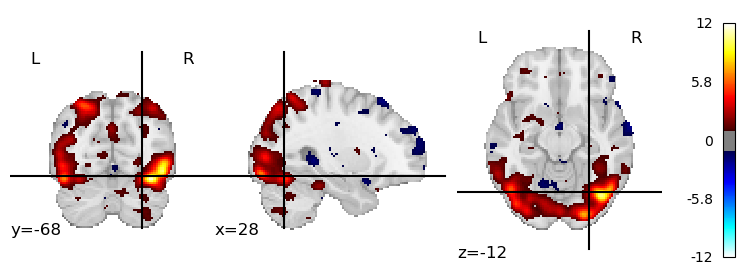

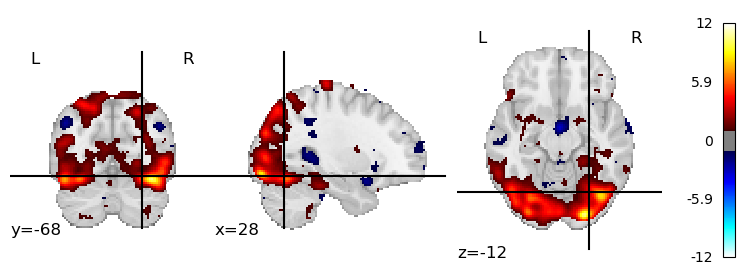

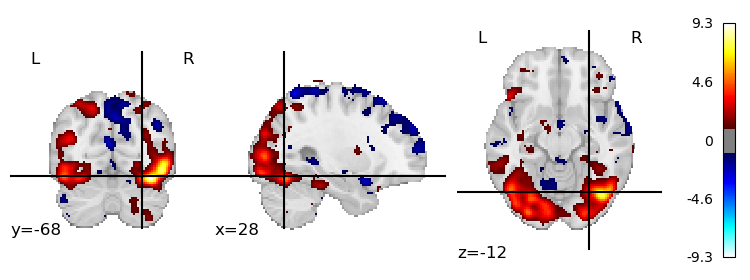

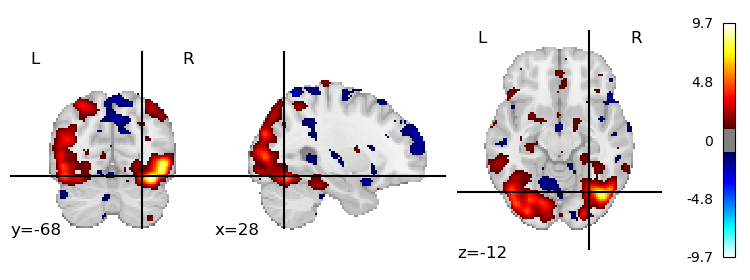

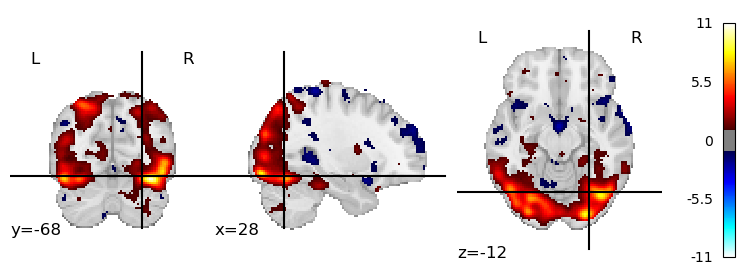

...

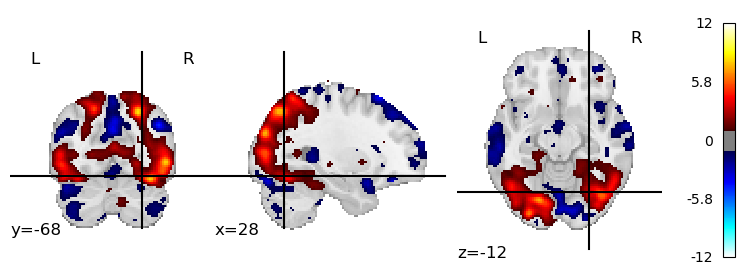

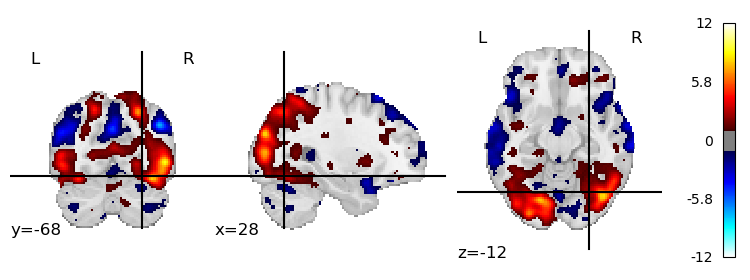

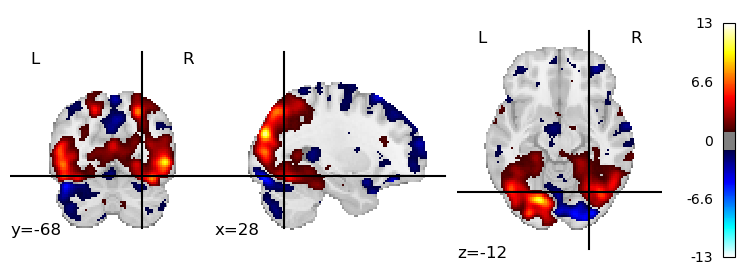

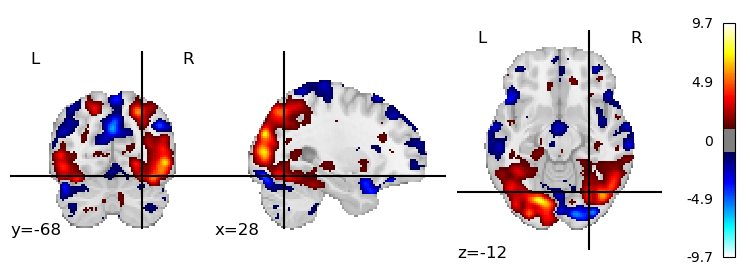

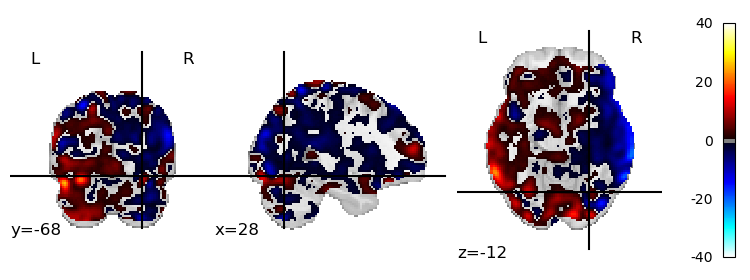

In [ ]:
for i in range(55):

    file_path2 = f'F:\yujun\projects\AI_IAPS\GLM\\betas\Sub1\\beta_00{str(i+1).zfill(2)}.nii'
    nii_data2 = nib.load(file_path2)
    # Apply the mask to the NIfTI image
    masked_data = masking.apply_mask(nii_data2, mni_mask_resampled)
    # Get the mask's indices in the original 3D shape
    mask_indices = np.where(mni_mask_resampled.get_fdata())
    # Create a new 3D array filled with zeros
    reshaped_data = np.zeros(nii_data2.shape)
    # Fill the new 3D array with the values from the masked data
    reshaped_data[mask_indices] = masked_data
    beta_nii = new_img_like(nii_data2, reshaped_data)
    plotting.plot_stat_map(beta_nii, threshold=1, cut_coords = [28, -68,-12])

plotting.show()

In [ ]:
combined_list = pl_na_idx.copy()
combined_list.extend(nt_na_idx)
combined_list.extend(up_na_idx)
combined_list.extend(pl_ai_idx)
combined_list.extend(nt_ai_idx)
combined_list.extend(up_ai_idx)

In [ ]:
combined_list = sorted(combined_list)
combined_list

[0,
 1,
 2,
 3,
 4,
 5,
 12,
 13,
 14,
 15,
 16,
 17,
 24,
 25,
 26,
 27,
 28,
 29,
 36,
 37,
 38,
 39,
 40,
 41,
 48,
 49,
 50,
 51,
 52,
 53,
 60,
 61,
 62,
 63,
 64,
 65,
 72,
 73,
 74,
 75,
 76,
 77,
 84,
 85,
 86,
 87,
 88,
 89,
 96,
 97,
 98,
 99,
 100,
 101,
 108,
 109,
 110,
 111,
 112,
 113]

Sub 1

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\displays\_slicers.py:144: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figure = plt.figure(figure, figsize=figsize,


FileNotFoundError: No such file or no access: 'F:\yujun\projects\AI_IAPS\GLM\betas\Sub1\beta_00100.nii'

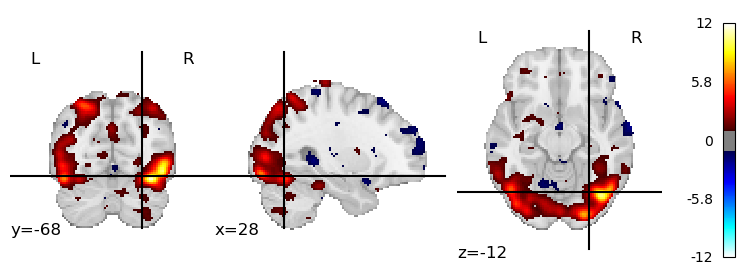

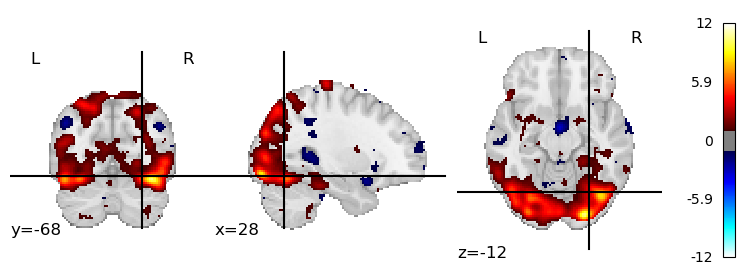

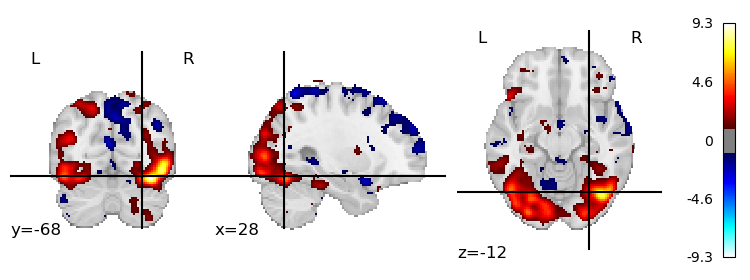

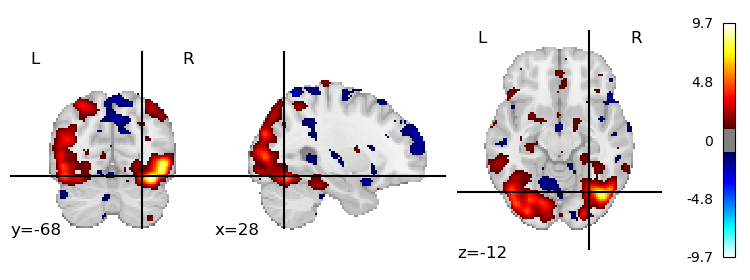

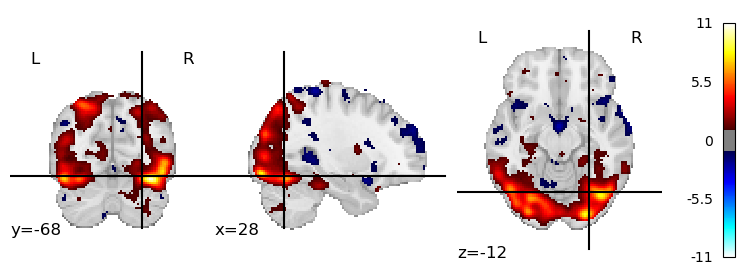

...

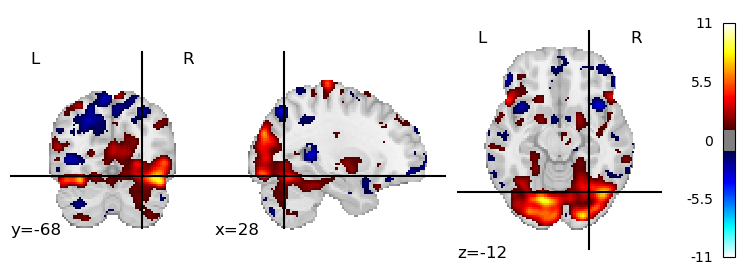

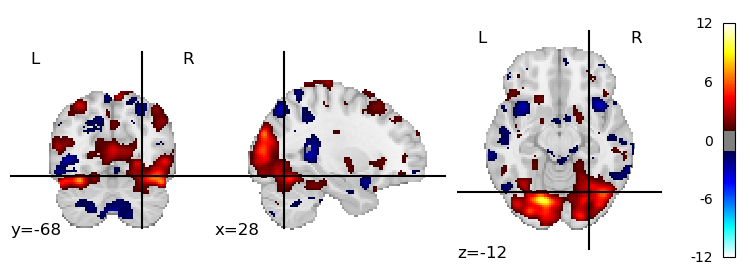

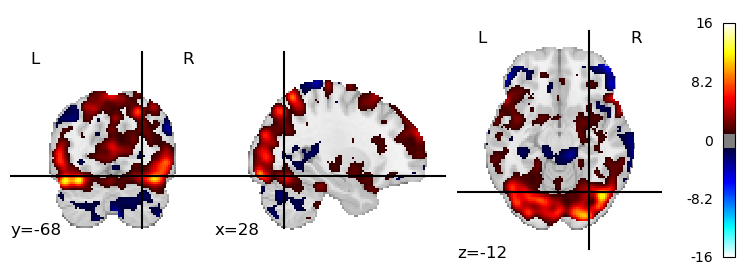

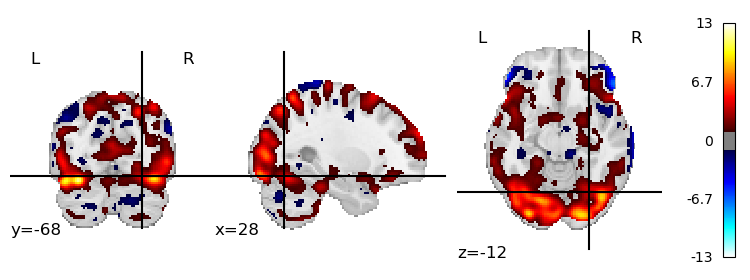

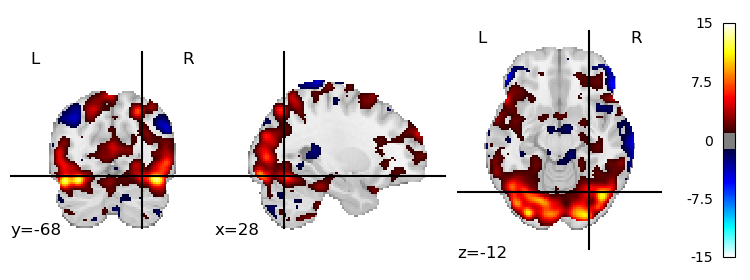

In [ ]:
for i in range(len(combined_list)):

    file_path2 = f'F:\yujun\projects\AI_IAPS\GLM\\betas\Sub1\\beta_00{str(combined_list[i]+1).zfill(2)}.nii'
    nii_data2 = nib.load(file_path2)
    # Apply the mask to the NIfTI image
    masked_data = masking.apply_mask(nii_data2, mni_mask_resampled)
    # Get the mask's indices in the original 3D shape
    mask_indices = np.where(mni_mask_resampled.get_fdata())
    # Create a new 3D array filled with zeros
    reshaped_data = np.zeros(nii_data2.shape)
    # Fill the new 3D array with the values from the masked data
    reshaped_data[mask_indices] = masked_data
    beta_nii = new_img_like(nii_data2, reshaped_data)
    plotting.plot_stat_map(beta_nii, threshold=1, cut_coords = [28, -68,-12])

plotting.show()

Sub 2

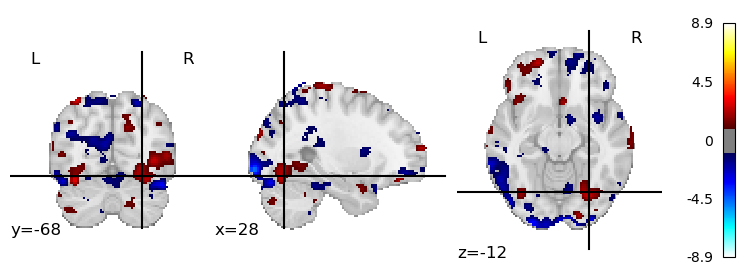

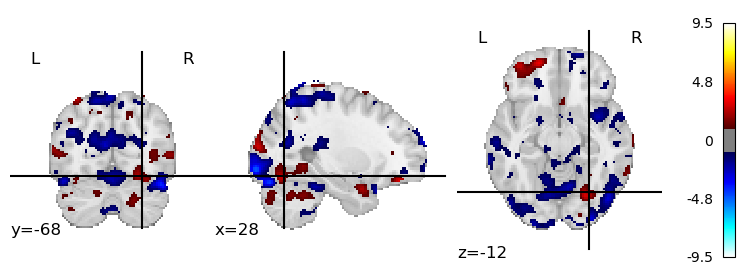

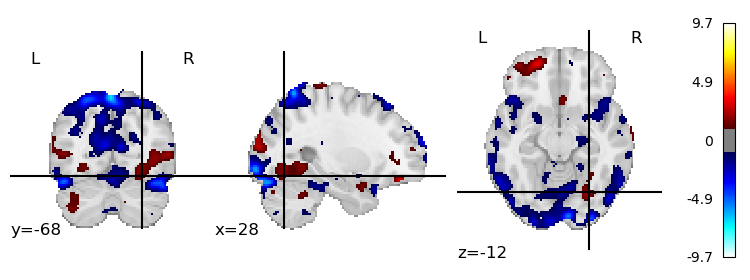

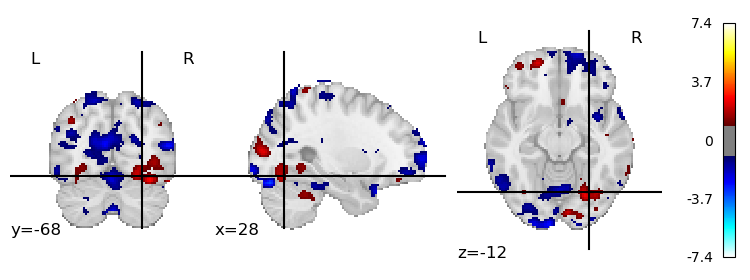

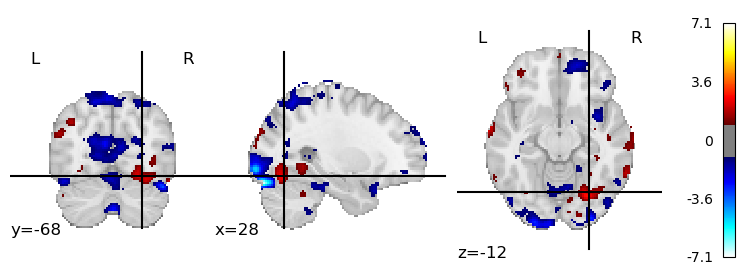

...

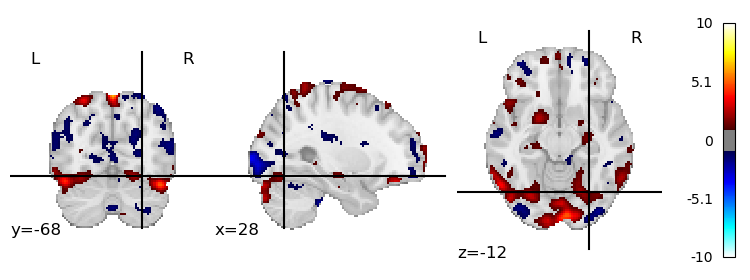

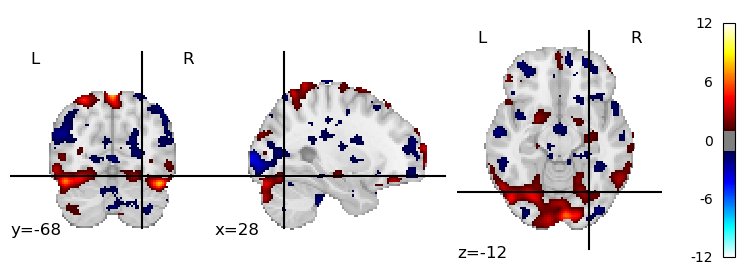

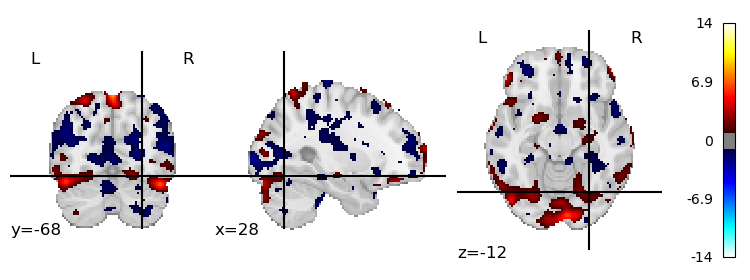

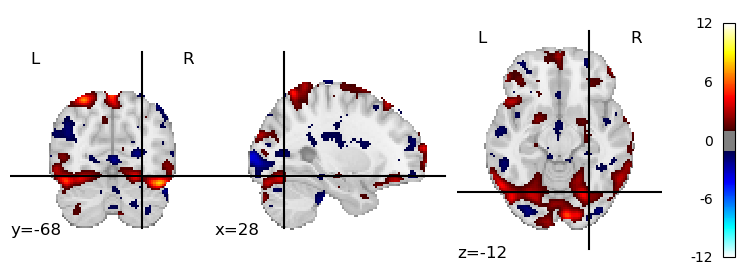

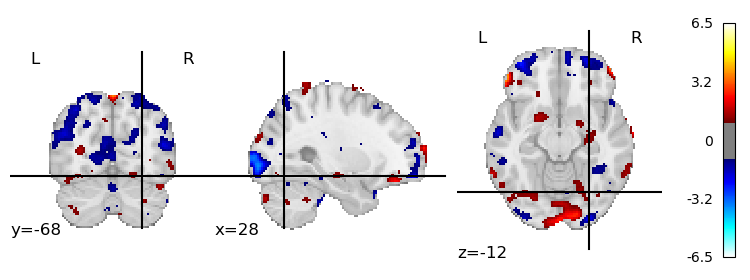

In [ ]:
for i in range(len(combined_list)):

    file_path2 = f'F:\yujun\projects\AI_IAPS\GLM\\betas\Sub2\\beta_0{str(combined_list[i]+1).zfill(3)}.nii'
    nii_data2 = nib.load(file_path2)
    # Apply the mask to the NIfTI image
    masked_data = masking.apply_mask(nii_data2, mni_mask_resampled)
    # Get the mask's indices in the original 3D shape
    mask_indices = np.where(mni_mask_resampled.get_fdata())
    # Create a new 3D array filled with zeros
    reshaped_data = np.zeros(nii_data2.shape)
    # Fill the new 3D array with the values from the masked data
    reshaped_data[mask_indices] = masked_data
    beta_nii = new_img_like(nii_data2, reshaped_data)
    plotting.plot_stat_map(beta_nii, threshold=1, cut_coords = [28, -68,-12])

plotting.show()

Sub 3

c:\Users\yujunchen\Anaconda3\envs\neuro\lib\site-packages\nilearn\plotting\displays\_slicers.py:144: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figure = plt.figure(figure, figsize=figsize,


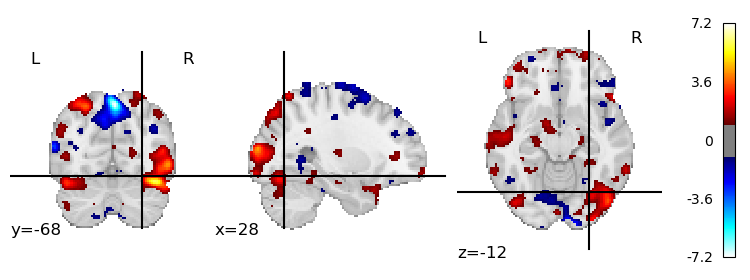

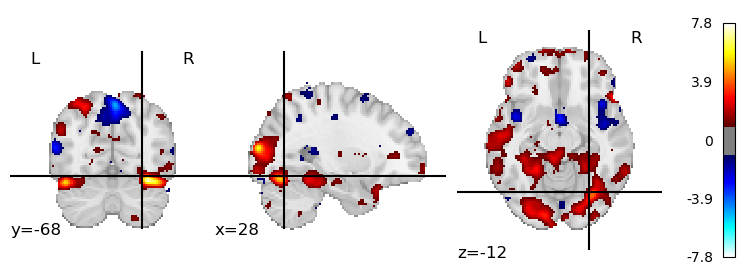

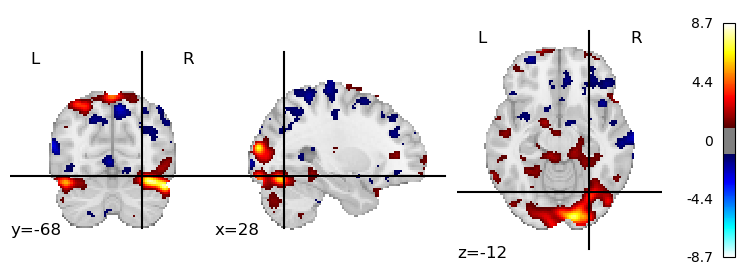

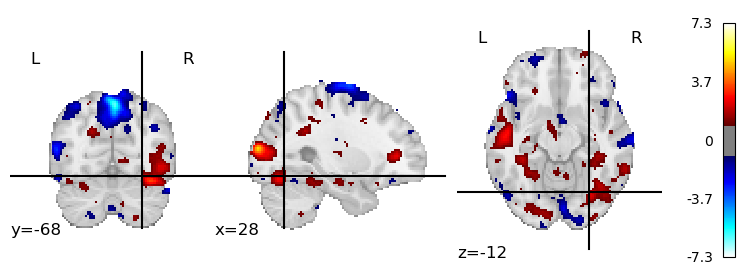

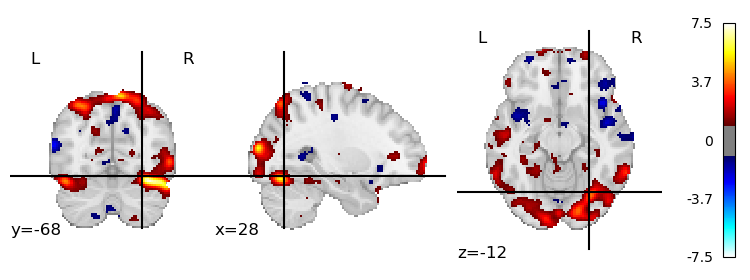

...

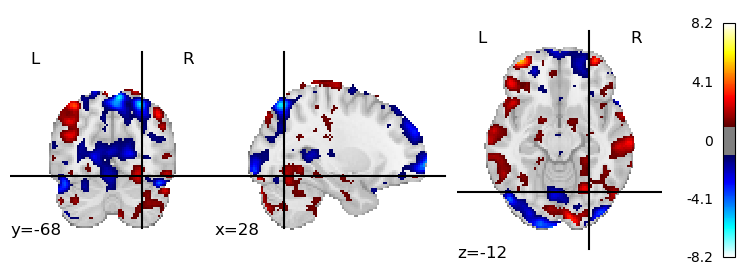

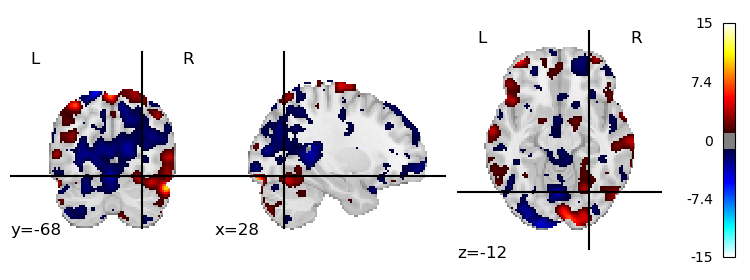

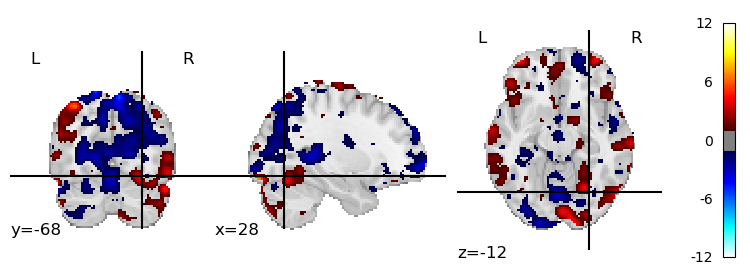

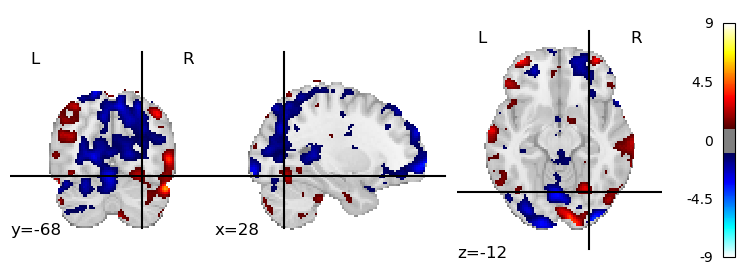

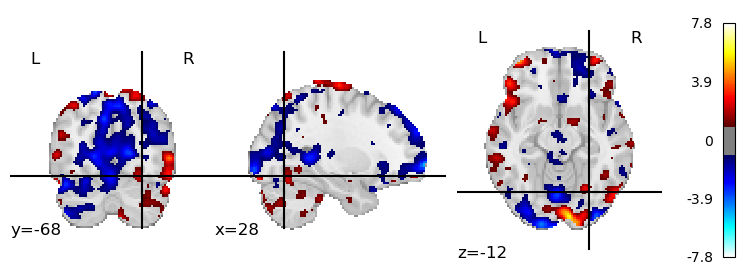

In [ ]:
for i in range(len(combined_list)):

    file_path2 = f'F:\yujun\projects\AI_IAPS\GLM\\betas\Sub3\\beta_0{str(combined_list[i]+1).zfill(3)}.nii'
    nii_data2 = nib.load(file_path2)
    # Apply the mask to the NIfTI image
    masked_data = masking.apply_mask(nii_data2, mni_mask_resampled)
    # Get the mask's indices in the original 3D shape
    mask_indices = np.where(mni_mask_resampled.get_fdata())
    # Create a new 3D array filled with zeros
    reshaped_data = np.zeros(nii_data2.shape)
    # Fill the new 3D array with the values from the masked data
    reshaped_data[mask_indices] = masked_data
    beta_nii = new_img_like(nii_data2, reshaped_data)
    plotting.plot_stat_map(beta_nii, threshold=1, cut_coords = [28, -68,-12])

plotting.show()

#